In [1]:
pip install pycountry_convert

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install folium


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install calmap

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [243]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import ticker 
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import json, requests
import calmap
from keras.layers import Input, Dense, Activation, LeakyReLU
from keras import models
from keras.optimizers import RMSprop, Adam
from sklearn.cluster import KMeans
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, add_changepoints_to_plot
import plotly.offline as py
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from keras.models import Sequential
from keras.layers import LSTM,Dense
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [6]:
import urllib.request
# Download the file from `url` and save it locally under `file_name`:
with urllib.request.urlopen("https://github.com/SaloniGoradia/COVID-19-CaseStudy-and-Predictions/blob/master/models/model_deaths_v2.h5?raw=true") as response, open('model_deaths_v2.h5', 'wb') as out_file:
    data = response.read() # a `bytes` object
    out_file.write(data)

In [7]:
import urllib.request
# Download the file from `url` and save it locally under `file_name`:
with urllib.request.urlopen("https://github.com/SaloniGoradia/COVID-19-CaseStudy-and-Predictions/blob/master/models/model_confirmed_v2.h5?raw=true") as response, open('model_confirmed_v2.h5', 'wb') as out_file:
    data = response.read() # a `bytes` object
    out_file.write(data)

In [8]:
import urllib.request
# Download the file from `url` and save it locally under `file_name`:
with urllib.request.urlopen("https://github.com/SaloniGoradia/COVID-19-CaseStudy-and-Predictions/blob/master/models/model_usa_c.h5?raw=true") as response, open('model_usa_c.h5', 'wb') as out_file:
    data = response.read() # a `bytes` object
    out_file.write(data)

In [9]:
#####################################Comparision between epidemics
epidemics = pd.DataFrame({
    'epidemic' : ['COVID-19', 'SARS', 'EBOLA', 'MERS', 'H1N1'],
    'start_year' : [2019, 2003, 2014, 2012, 2009],
    'end_year' : [2020, 2004, 2016, 2017, 2010],
    'confirmed' : [2328600, 8096, 28646, 2494, 6724149],
    'deaths' : [160706, 774, 11323, 858, 19654]
})

epidemics['mortality'] = round((epidemics['deaths']/epidemics['confirmed'])*100, 2)

epidemics.head()


,epidemic,start_year,end_year,confirmed,deaths,mortality
0,COVID-19,2019,2020,2328600,160706,6.90
1,SARS,2003,2004,8096,774,9.56
2,EBOLA,2014,2016,28646,11323,39.53
3,MERS,2012,2017,2494,858,34.40
4,H1N1,2009,2010,6724149,19654,0.29


In [10]:
temp = epidemics.melt(id_vars='epidemic', value_vars=['confirmed', 'deaths', 'mortality'],
                      var_name='Case', value_name='Value')

fig = px.bar(temp, x="epidemic", y="Value", color='epidemic', text='Value', facet_col="Case",
             color_discrete_sequence = px.colors.qualitative.Bold)
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_yaxes(showticklabels=False)
fig.layout.yaxis2.update(matches=None)
fig.layout.yaxis3.update(matches=None)
fig.show()

In [11]:
################################################Symptoms of corona virus
symptoms={'symptoms':['Fever',
        'Dry cough',
        'Fatigue',
        'Sputum production',
        'Shortness of breath',
        'Muscle pain',
        'Sore throat',
        'Headache',
        'Chills',
        'Nausea or vomiting',
        'Nasal congestion',
        'Diarrhoea',
        'Haemoptysis',
        'Conjunctival congestion'],'percentage':[87.9,67.7,38.1,33.4,18.6,14.8,13.9,13.6,11.4,5.0,4.8,3.7,0.9,0.8]}

symptoms=pd.DataFrame(data=symptoms,index=range(14))
symptoms

,symptoms,percentage
0,Fever,87.9
1,Dry cough,67.7
2,Fatigue,38.1
3,Sputum production,33.4
4,Shortness of breath,18.6
5,Muscle pain,14.8
6,Sore throat,13.9
7,Headache,13.6
8,Chills,11.4
9,Nausea or vomiting,5.0


In [12]:
fig = px.bar(symptoms[['symptoms', 'percentage']].sort_values('percentage', ascending=False), 
             y="percentage", x="symptoms", color='symptoms', 
             log_y=True, template='ggplot2', title='Symptoms of  Coronavirus')
fig.show()

In [13]:
# Reading Dataset
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

In [14]:
df_recovered = pd.read_csv("https://github.com/CSSEGISandData/COVID-19/raw/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv")
df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])

In [ ]:
df_confirmed.head(2)

In [16]:
df_deaths.head(2)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,21,23,25,30,30,30,33,36,36,40
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,23,24,25,26,26,26,26,26,26,27


In [17]:
df_recovered.head(2)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,32,40,43,54,99,112,131,135,150,166
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,232,248,251,277,283,302,314,327,345,356


In [18]:
df_covid19.head(2)

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
0,Australia,2020-04-23 04:43:07,-25.0000,133.0000,6547,67,4124,2356,25.715150,NaN,NaN,1.023369,36,AUS
1,Austria,2020-04-23 04:42:14,47.5162,14.5501,14925,510,11328,3087,165.715491,NaN,NaN,3.417085,40,AUT


In [19]:
df_table.head(5)

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String
0,Afghanistan,2020-01-22,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22
1,Afghanistan,2020-01-23,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23
2,Afghanistan,2020-01-24,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24
3,Afghanistan,2020-01-25,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25
4,Afghanistan,2020-01-26,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26


In [20]:
###########################################Data Preprocessing

df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})
df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]
df_recovered = df_recovered.rename(columns={"Province/State":"state","Country/Region": "country"})

In [21]:
# Changing the conuntry names as required by pycountry_convert Lib
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"
df_recovered.loc[df_recovered['country'] == "US", "country"] = "USA"

df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"
df_recovered.loc[df_recovered['country'] == 'Korea, South', "country"] = 'South Korea'

df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"
df_recovered.loc[df_recovered['country'] == 'Taiwan*', "country"] = 'Taiwan'

df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"
df_recovered.loc[df_recovered['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_deaths.loc[df_deaths['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country_Region'] == "Cote d'Ivoire", "Country_Region"] = "Côte d'Ivoire"
df_recovered.loc[df_recovered['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"

df_confirmed.loc[df_confirmed['country'] == "Reunion", "country"] = "Réunion"
df_deaths.loc[df_deaths['country'] == "Reunion", "country"] = "Réunion"
df_covid19.loc[df_covid19['country'] == "Reunion", "country"] = "Réunion"
df_table.loc[df_table['Country_Region'] == "Reunion", "Country_Region"] = "Réunion"
df_recovered.loc[df_recovered['country'] == "Reunion", "country"] = "Réunion"

df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"
df_recovered.loc[df_recovered['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_deaths.loc[df_deaths['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_covid19.loc[df_covid19['country'] == "Bahamas, The", "country"] = "Bahamas"
df_table.loc[df_table['Country_Region'] == "Bahamas, The", "Country_Region"] = "Bahamas"
df_recovered.loc[df_recovered['country'] == 'Bahamas, The', "country"] = 'Bahamas'

df_confirmed.loc[df_confirmed['country'] == 'Gambia, The', "country"] = 'Gambia'
df_deaths.loc[df_deaths['country'] == 'Gambia, The', "country"] = 'Gambia'
df_covid19.loc[df_covid19['country'] == "Gambia, The", "country"] = "Gambia"
df_table.loc[df_table['Country_Region'] == "Gambia", "Country_Region"] = "Gambia"
df_recovered.loc[df_recovered['country'] == 'Gambia, The', "country"] = 'Gambia'

# getting all countries
countries = np.asarray(df_confirmed["country"])
countries1 = np.asarray(df_covid19["country"])

# Continent_code to Continent_names
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Defininng Function for getting continent code for country.
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'

#Collecting Continent Information
df_confirmed.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
df_deaths.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries[:]])
df_covid19.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in countries1[:]])
df_table.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in df_table["Country_Region"].values])
df_recovered.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in df_recovered["country"].values])   


In [22]:
df_table = df_table[df_table["continent"] != "Others"]

In [23]:
df_table.head(5)

,Country_Region,continent,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String
0,Afghanistan,Asia,2020-01-22,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22
1,Afghanistan,Asia,2020-01-23,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23
2,Afghanistan,Asia,2020-01-24,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24
3,Afghanistan,Asia,2020-01-25,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25
4,Afghanistan,Asia,2020-01-26,0,0,NaN,NaN,0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26


In [24]:
df_deaths[df_deaths["continent" ]== 'Others']

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
88,NaN,Diamond Princess,Others,0.000000,0.000000,0,0,0,0,0,...,11,12,12,12,13,13,13,13,13,13
127,NaN,Holy See,Others,41.902900,12.453400,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
236,NaN,Timor-Leste,Others,-8.874217,125.727539,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
241,NaN,West Bank and Gaza,Others,31.952200,35.233200,0,0,0,0,0,...,2,2,2,2,2,2,3,3,4,4
247,NaN,Kosovo,Others,42.602636,20.902977,0,0,0,0,0,...,7,8,8,11,12,12,12,12,12,12
248,NaN,Burma,Others,21.916200,95.956000,0,0,0,0,0,...,4,4,4,4,4,5,5,5,5,5
252,NaN,MS Zaandam,Others,0.000000,0.000000,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2
261,NaN,Western Sahara,Others,24.215500,-12.885800,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
df_confirmed = df_confirmed.replace(np.nan, '', regex=True)
df_deaths = df_deaths.replace(np.nan, '', regex=True)
df_recovered = df_recovered.replace(np.nan, '', regex=True)

In [26]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)
    
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]
    
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    
    return np.nan_to_num(mortality_rate)
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days


out = ""#+"output/"

In [27]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update','People_Tested','People_Hospitalized','UID'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)

df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update','People_Tested','People_Hospitalized','UID'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()

In [28]:
df_countries_cases.head(5)

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate,ISO3
country,,,,,,,
Australia,6547,67,4124,2356,25.715150,1.023369,AUS
Austria,14925,510,11328,3087,165.715491,3.417085,AUT
Canada,41650,2081,14490,25079,110.023055,4.996399,CAN
China,83876,4636,77911,1329,5.971198,5.527207,CHN
Denmark,8108,384,5276,2448,139.981282,4.736063,DNK


In [29]:
df_continents_cases

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate
continent,,,,,,
Africa,25934,1240,6963,17731,249.022188,195.111781
Asia,421833,15848,198848,207137,1448.596702,83.498987
Australia,8024,83,5197,2744,57.902293,2.126057
Europe,1165458,111249,364791,689418,8525.812881,214.319856
North America,908779,50390,95356,763033,746.252670,128.280064
Others,1870,36,824,1010,1152.929553,31.181896
South America,97031,4595,41315,51121,252.352363,61.182324


In [30]:
df_t = pd.DataFrame(pd.to_numeric(df_countries_cases.sum()),dtype=np.float64).transpose()
df_t["Mortality Rate (per 100)"] = np.round(100*df_t["Deaths"]/df_t["Confirmed"],2)
df_t.style.background_gradient(cmap='Wistia',axis=1).format("{:.0f}",subset=["Confirmed"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate,Mortality Rate (per 100)
0,2628929,183441.000000,713294.000000,1732194.000000,12432.868650,715.700965,6.980000


In [31]:
#Continent wise cases
df_continents_cases["Mortality Rate (per 100)"] = np.round(100*df_continents_cases["Deaths"]/df_continents_cases["Confirmed"],2)
df_continents_cases.style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])\
                        .background_gradient(cmap='Greens',subset=["Recovered"])\
                        .background_gradient(cmap='Purples',subset=["Active"])\
                        .background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate,Mortality Rate (per 100)
continent,,,,,,,
Africa,25934,1240,6963,17731,249.022188,195.111781,4.780000
Asia,421833,15848,198848,207137,1448.596702,83.498987,3.760000
Australia,8024,83,5197,2744,57.902293,2.126057,1.030000
Europe,1165458,111249,364791,689418,8525.812881,214.319856,9.550000
North America,908779,50390,95356,763033,746.252670,128.280064,5.540000
Others,1870,36,824,1010,1152.929553,31.181896,1.930000
South America,97031,4595,41315,51121,252.352363,61.182324,4.740000


In [32]:
#Contry wise cases
df_countries_cases["Mortality Rate (per 100)"] = np.round(100*df_countries_cases["Deaths"]/df_countries_cases["Confirmed"],2)
df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])\
                        .background_gradient(cmap='Greens',subset=["Recovered"])\
                        .background_gradient(cmap='Purples',subset=["Active"])\
                        .background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])


,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate,ISO3,Mortality Rate (per 100)
country,,,,,,,,
USA,842629,46784,76601,719244,255.755761,5.552147,USA,5.550000
Spain,208389,21717,85915,100757,445.706271,10.421375,ESP,10.420000
Italy,187327,25085,54543,107699,309.826888,13.391022,ITA,13.390000
France,157135,21373,41331,94431,240.733178,13.601680,FRA,13.600000
Germany,150648,5315,103300,42033,179.805331,3.528092,DEU,3.530000
United Kingdom,134638,18151,683,115804,198.329541,13.481335,GBR,13.480000
Turkey,98674,2376,16477,79821,116.996789,2.407929,TUR,2.410000
Iran,85996,5391,63113,17492,102.384780,6.268896,IRN,6.270000
China,83876,4636,77911,1329,5.971198,5.527207,CHN,5.530000


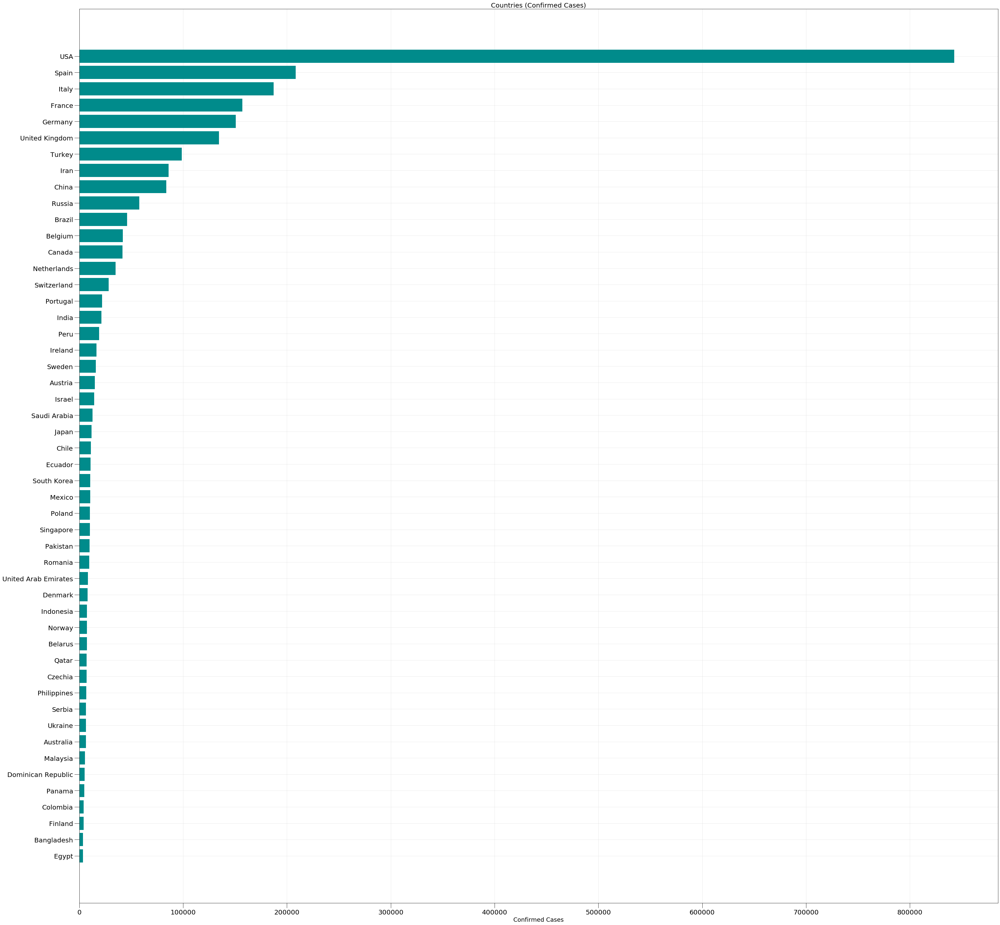

In [33]:
f = plt.figure(figsize=(50,50))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-50:],
         df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-50:],color="darkcyan")
plt.tick_params(size=15,labelsize = 20)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig(out+'Confirmed Cases.png')

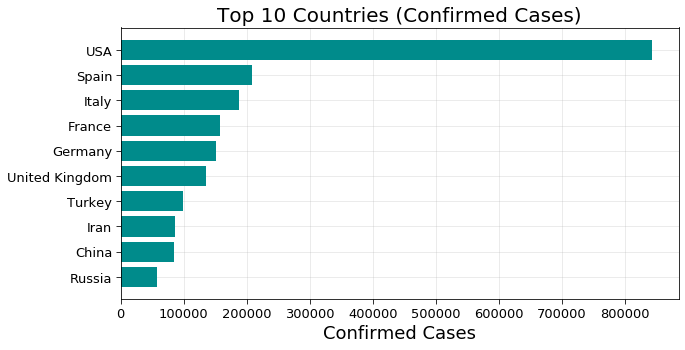

In [34]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],
         df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig(out+'Top 10 Countries (Confirmed Cases).jpg')

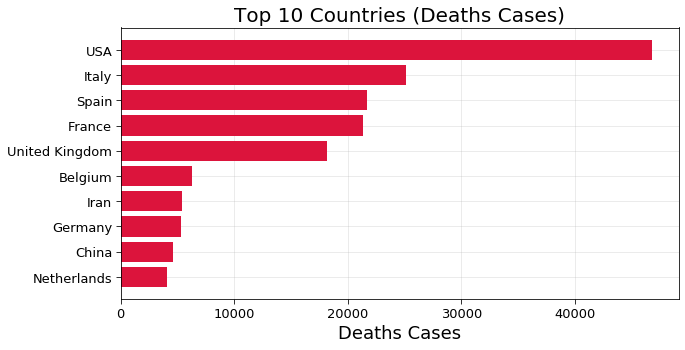

In [35]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],
         df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths Cases",fontsize=18)
plt.title("Top 10 Countries (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Deaths Cases).png')

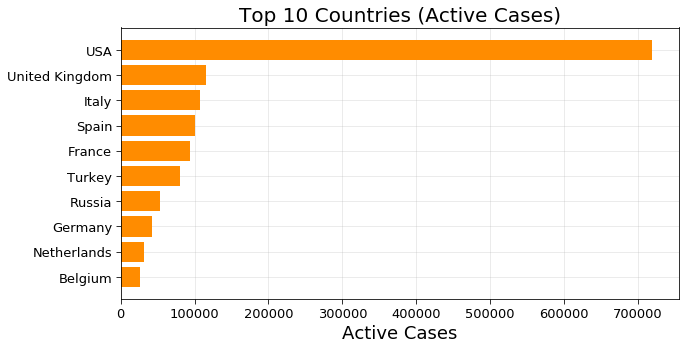

In [36]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],
         df_countries_cases.sort_values('Active')["Active"].values[-10:],color="darkorange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Active Cases).png')

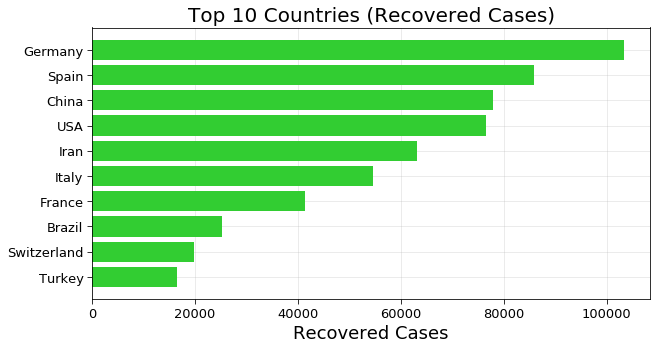

In [37]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],
         df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="limegreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Recovered Cases).png')

AttributeError: 'DataFrame' object has no attribute 'ix'

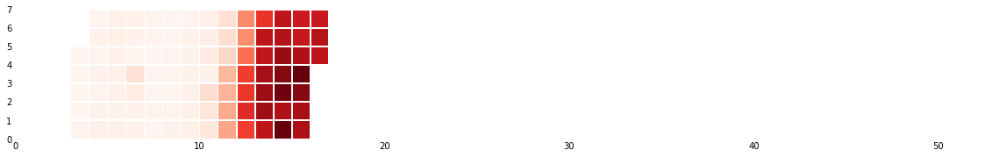

In [38]:
#f = plt.figure(figsize=(20,10))
#f.add_subplot(2,1,1)
#calmap.yearplot(df_table.groupby('Last_Update')['Confirmed'].sum().diff(), fillcolor='white', cmap='Blues', linewidth=0.5,linecolor="#fafafa",year=2020,)
#plt.title("Daily Confirmed Cases",fontsize=20)
#plt.tick_params(labelsize=15)

#f.add_subplot(2,1,2)
#calmap.yearplot(df_table.groupby('Last_Update')['Deaths'].sum().diff(), fillcolor='white', cmap='Reds', linewidth=1,linecolor="#fafafa",year=2020,)
#plt.title("Daily Deaths Cases",fontsize=20)
#plt.tick_params(labelsize=15)
#plt.show()


temp = df_table.groupby('Last_Update')['Confirmed'].sum()
temp = temp.diff()

plt.figure(figsize=(20, 5))
ax = calmap.yearplot(temp, fillcolor='white', cmap='Reds', linewidth=0.5)

In [39]:
#Correlation in countries
df_countries_cases.iloc[:,:-1].corr().style.background_gradient(cmap='Blues')

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate
Confirmed,1.000000,0.925996,0.678191,0.979677,0.175959,0.157609
Deaths,0.925996,1.000000,0.686245,0.879890,0.221661,0.279545
Recovered,0.678191,0.686245,1.000000,0.518821,0.193544,0.179073
Active,0.979677,0.879890,0.518821,1.000000,0.148060,0.124248
Incident_Rate,0.175959,0.221661,0.193544,0.148060,1.000000,0.109657
Mortality_Rate,0.157609,0.279545,0.179073,0.124248,0.109657,1.000000


In [40]:
#Correlation in continents
df_continents_cases.iloc[:,:-1].corr().style.background_gradient(cmap='Reds')

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate
Confirmed,1.000000,0.948371,0.847591,0.971578,0.756993,0.619224
Deaths,0.948371,1.000000,0.885843,0.875703,0.908476,0.666104
Recovered,0.847591,0.885843,1.000000,0.699215,0.899886,0.578426
Active,0.971578,0.875703,0.699215,1.000000,0.607177,0.570130
Incident_Rate,0.756993,0.908476,0.899886,0.607177,1.000000,0.597698
Mortality_Rate,0.619224,0.666104,0.578426,0.570130,0.597698,1.000000


In [41]:
world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=1)
for i in range(0,len(df_confirmed)):
    folium.Circle(
        location=[df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_confirmed.iloc[i]['country']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_confirmed.iloc[i]['state']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(df_deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(world_map)

world_map


In [42]:
#Heatmap for confirmed cases globally
temp_df = pd.DataFrame(df_countries_cases['Confirmed'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df["Confirmed"]), 
                    hover_name="country", # column to add to hover information
                    hover_data=["Confirmed"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Confirmed Cases Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Confirmed Cases(Log Scale)",colorscale="Blues")
fig.show()

In [47]:
#Heatmap for Deaths globally
temp_df = pd.DataFrame(df_countries_cases['Deaths'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df["Deaths"]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Deaths"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Deaths Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Deaths (Log Scale)",colorscale="Reds")
fig.show()

In [44]:
#Heatmap for recovered cases globally
temp_df = pd.DataFrame(df_countries_cases['Recovered'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df.iloc[:,-1]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Recovered"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Recovered Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Recovered",colorscale="Greens")
fig.show()

In [45]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index()
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations="Country_Region", locationmode='country names', 
                     color=np.power(df_data["Confirmed"],0.3)-2 , size= np.power(df_data["Confirmed"]+1,0.3)-1, hover_name="Country_Region",
                     hover_data=["Confirmed"],
                     range_color= [0, max(np.power(df_data["Confirmed"],0.3))], 
                     projection="natural earth", animation_frame="Last_Update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Progression of spread'
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

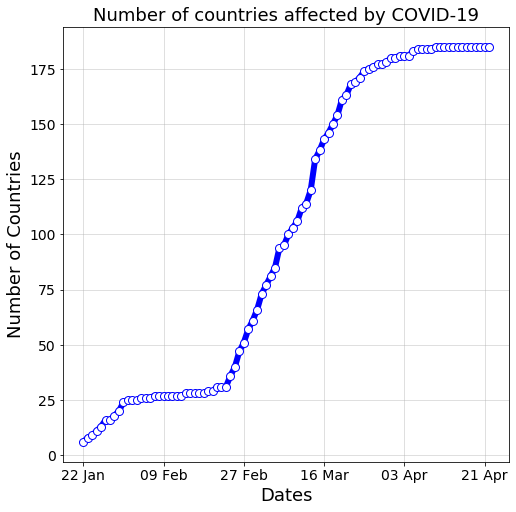

In [46]:
case_nums_country = df_confirmed.groupby("country").sum().drop(['Lat','Long'],axis =1).apply(lambda x: x[x > 0].count(), axis =0)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

f = plt.figure(figsize=(8,8))
f.add_subplot(111)
marker_style = dict(c="blue",linewidth=6, linestyle='-', marker='o',markersize=8, markerfacecolor='#ffffff')
plt.plot(d, case_nums_country,**marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(list(np.arange(0,len(d),int(len(d)/5))),d[:-1:int(len(d)/5)]+[d[-1]])

#labels
plt.xlabel("Dates",fontsize=18)
plt.ylabel("Number of Countries",fontsize=18)
plt.grid(alpha = 0.5)
plt.title("Number of countries affected by COVID-19",fontsize=18)
plt.savefig(out+'spread.png')
plt.show()
plt.close()

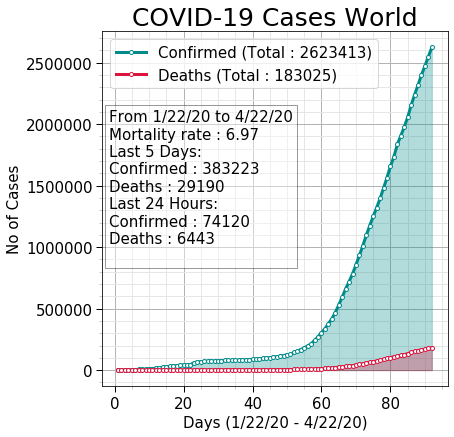

In [48]:
cols = 1
rows = 1
f = plt.figure(figsize=(8,8*rows))

visualize_covid_cases(df_confirmed, df_deaths,continent = "All",figure = [f,rows,cols, 1])

plt.savefig(out+'COIVD-19-World.png')
plt.show()

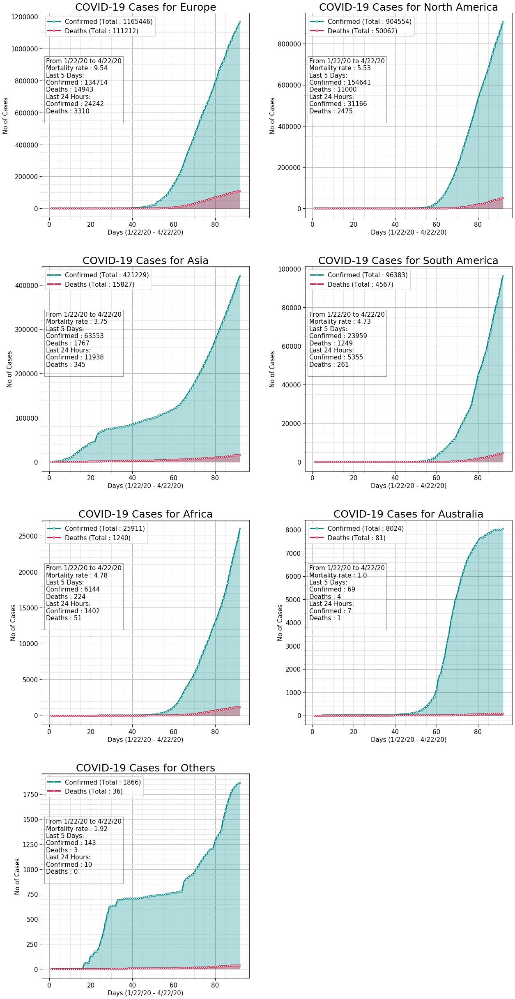

In [49]:
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index

cols =2
rows = int(np.ceil(continents.shape[0]/cols))
f = plt.figure(figsize=(20,9*rows))
for i,continent in enumerate(continents):
    visualize_covid_cases(df_confirmed, df_deaths, continent = continent,figure = [f,rows,cols, i+1])

plt.show()

In [ ]:
df_countries = df_confirmed.groupby(["country"]).sum()
df_countries = df_countries.sort_values(df_countries.columns[-1],ascending = False)
countries = df_countries[df_countries[df_countries.columns[-1]] >= 1500].index

cols =2
rows = int(np.ceil(countries.shape[0]/cols))
f = plt.figure(figsize=(18,7*rows))
for i,country in enumerate(countries):
    visualize_covid_cases(df_confirmed, df_deaths,country = country,figure = [f,rows,cols, i+1])
plt.show()

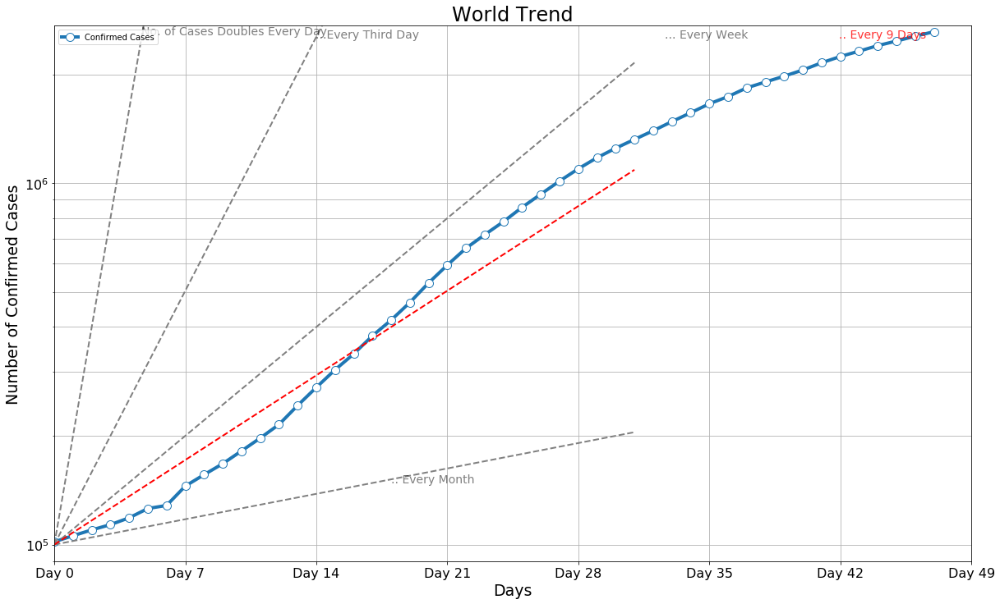

In [50]:
temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(20,12))
f.add_subplot(111)

threshold = 100000

t = temp_data.values
t = t[t >threshold]

date = np.arange(0,len(t[:]))
xnew = np.linspace(date.min(), date.max(), 10)
spl = make_interp_spline(date, t, k=1)  # type: BSpline
power_smooth = spl(xnew)

marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
plt.plot(date,t,"-.",label="Confirmed Cases",**marker_style)


# Reference lines 
x = np.arange(0,32)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of Cases Doubles Every Day",(np.log2((t.max()-threshold)/threshold),t.max()-threshold/2),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/3+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("...Every Third Day",(np.log2((t.max()-threshold)/threshold)*3,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("... Every Week",(np.log2((t.max()-threshold)/threshold)*7,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. Every Month",(18,2**(17/30+np.log2(threshold))),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/9+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. Every 9 Days",(np.log2((t.max()-threshold)/threshold)*9,t.max()-threshold),color="Red",xycoords="data",fontsize=14,alpha = 0.8)


plt.xlim(date[0],date[-1])
plt.ylim(threshold - threshold/10,t.max()+threshold)
# plot Params
# plt.tight_layout()
plt.tick_params(labelsize = 16)        
plt.xticks(np.arange(0,len(t[:])+7,7),[ "Day "+str(i) for i in range(len(t[:])+7)][::7]) 
plt.xlabel("Days",fontsize=19)
plt.ylabel("Number of Confirmed Cases",fontsize=19)
plt.title("World Trend",fontsize=24)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+"World Trend Confirmed cases.png")
plt.show()


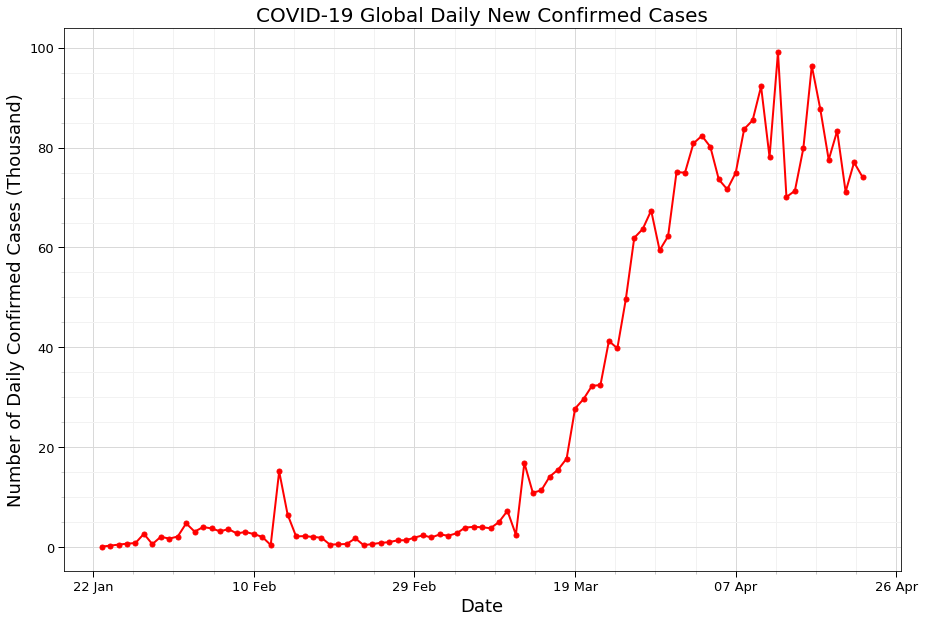

In [53]:
# Data
temp_data = np.nan_to_num(df_confirmed.sum()[5:].diff())
thousand = 1000
prediction_days = 7

# Plot
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=2, linestyle='-', marker='o',markersize=5)
plt.plot(date,temp_data/thousand,"-.",color="red",**marker_style)


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=12)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Global Daily New Confirmed Cases",{'fontsize':20})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Confirmed Cases (Thousand)",fontsize =18)

# plt.yscale("log")
plt.tick_params(labelsize = 13) 
plt.savefig(out+"daily confirmed cases global.png")
plt.show()

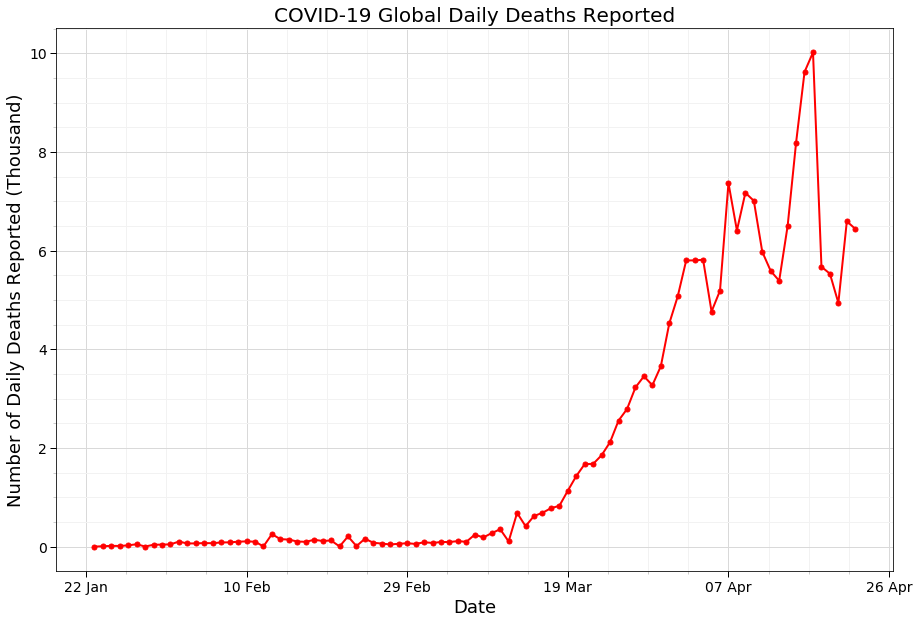

In [54]:
# Data
temp_data = np.nan_to_num(df_deaths.sum()[5:].diff())


# Plot
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=2, linestyle='-', marker='o',markersize=5)
plt.plot(date,temp_data/thousand,"-.",color="red",**marker_style)


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Global Daily Deaths Reported",{'fontsize':20})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Deaths Reported (Thousand)",fontsize =18)

# plt.yscale("log")
plt.savefig(out+"daily deaths cases Global.png")
plt.show()


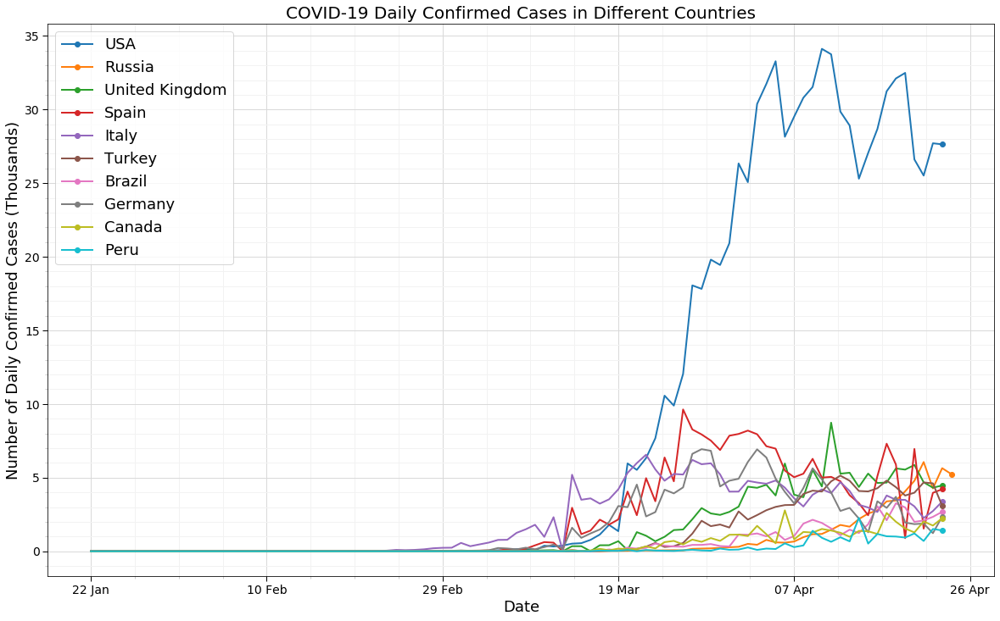

In [55]:
thoudand = 1000
temp = df_confirmed.groupby('country').sum().diff(axis=1).sort_values(df_deaths.columns[-1],ascending =False).head(10).replace(np.nan,0)
threshold = 0
f = plt.figure(figsize=(20,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    t = temp.loc[temp.index== country].values[0]
    t = t[t>=threshold]
    
    date = np.arange(0,len(t[:]))
    plt.plot(date,t/thoudand,'-o',label = country,linewidth =2, markevery=[-1])


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Daily Confirmed Cases in Different Countries",{'fontsize':20})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Confirmed Cases (Thousands)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize=18) 
plt.savefig(out+"daily confirmed cases countrywise.png")
plt.show()


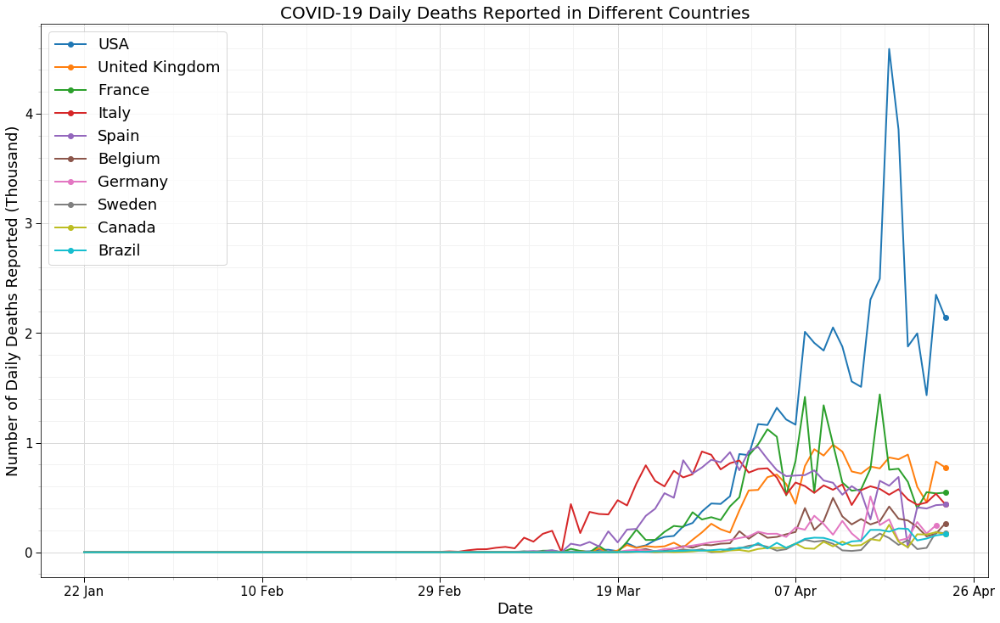

In [56]:
thoudand = 1000
temp = df_deaths.groupby('country').sum().diff(axis=1).sort_values(df_deaths.columns[-1],ascending =False).head(10).replace(np.nan,0)
threshold = 0
f = plt.figure(figsize=(20,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    t = temp.loc[temp.index== country].values[0]
    t = t[t>=threshold]
    
    date = np.arange(0,len(t[:]))
    plt.plot(date,t/thoudand,'-o',label = country,linewidth =2, markevery=[-1])


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=15)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Daily Deaths Reported in Different Countries",{'fontsize':20})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Deaths Reported (Thousand)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize=18) 
plt.savefig(out+"daily deaths reported countrywise.png")
plt.show()


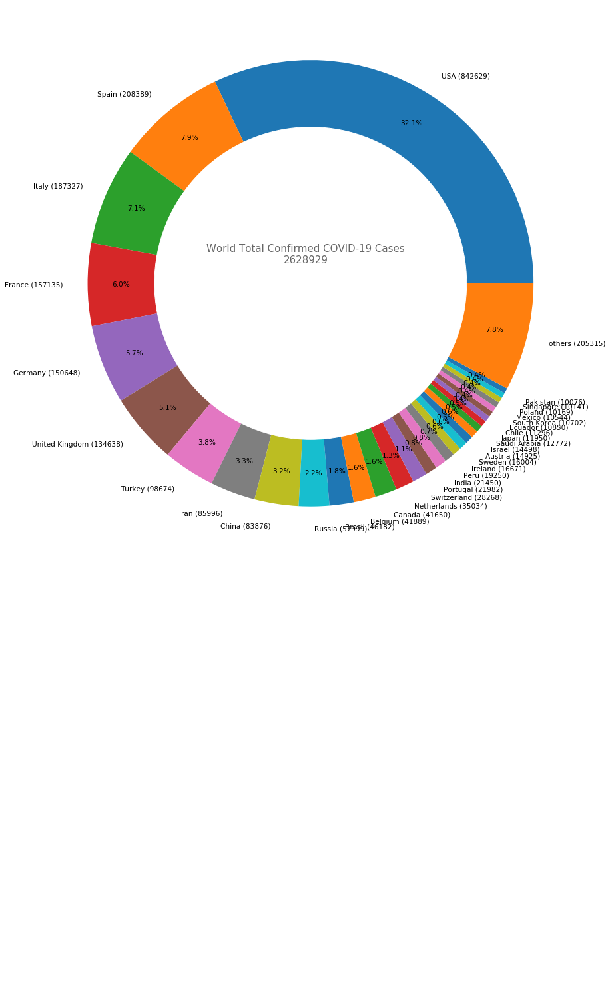

In [65]:
#rows = 4
f = plt.figure(figsize=(15,15*rows))

stats = [df_covid19.loc[:,['country','Confirmed']]]
label = ["Confirmed"]
threshold = [10000]
for i, stat in enumerate(stats):
    plt.tight_layout()
    df_countries = stat.groupby(["country"]).sum()
    df_countries = df_countries.sort_values(df_countries.columns[-1],ascending= False)
    others = df_countries[df_countries[df_countries.columns[-1]] < threshold[i] ].sum()[-1]
    df_countries = df_countries[df_countries[df_countries.columns[-1]] > threshold[i]]
    df_countries = df_countries[df_countries.columns[-1]]
    df_countries["others"] = others
    labels = [df_countries.index[i] +" (" + str(int(df_countries[i])) +") "for i in range(df_countries.shape[0])]

  #  ax = f.add_subplot(rows,1,i+1)
    plt.pie(df_countries, labels=labels,autopct='%1.1f%%',pctdistance=0.85, labeldistance=1.1,textprops = {'fontsize':10.5})
    my_circle=plt.Circle( (0,0), 0.7, color='white')
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.text(0.25,1.55,"World Total "+label[i]+ " COVID-19 Cases\n"+str(stat.sum().values[1]), horizontalalignment='center',verticalalignment='center',transform=ax.transAxes, size=15, alpha = 0.6)


plt.show()

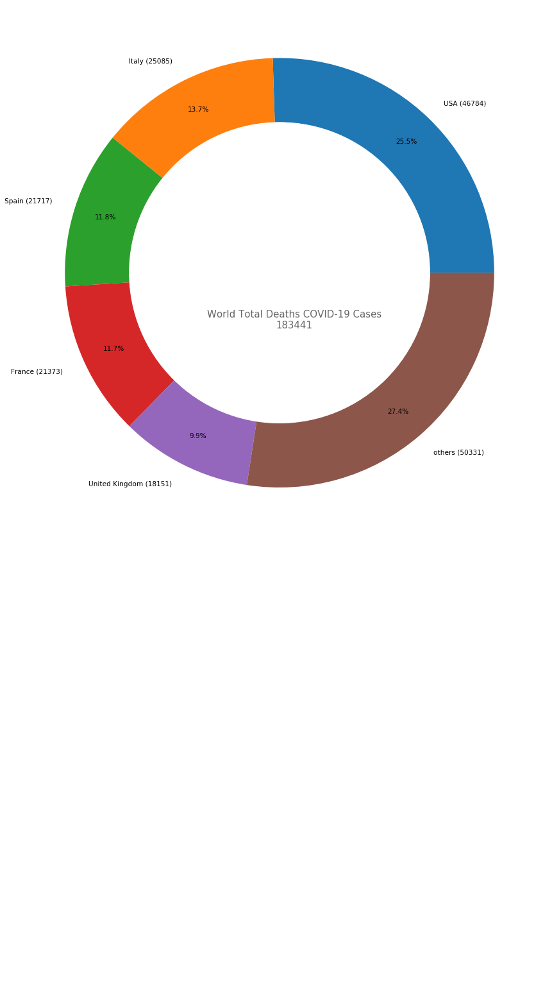

In [70]:
#rows = 4
f = plt.figure(figsize=(15,15*rows))

stats = [df_covid19.loc[:,['country','Deaths']]]
label = ["Deaths"]
threshold = [10000]
for i, stat in enumerate(stats):
    plt.tight_layout()
    df_countries = stat.groupby(["country"]).sum()
    df_countries = df_countries.sort_values(df_countries.columns[-1],ascending= False)
    others = df_countries[df_countries[df_countries.columns[-1]] < threshold[i] ].sum()[-1]
    df_countries = df_countries[df_countries[df_countries.columns[-1]] > threshold[i]]
    df_countries = df_countries[df_countries.columns[-1]]
    df_countries["others"] = others
    labels = [df_countries.index[i] +" (" + str(int(df_countries[i])) +") "for i in range(df_countries.shape[0])]

  #  ax = f.add_subplot(rows,1,i+1)
    plt.pie(df_countries, labels=labels,autopct='%1.1f%%',pctdistance=0.85, labeldistance=1.1,textprops = {'fontsize':10.5})
    my_circle=plt.Circle( (0,0), 0.7, color='white')
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.text(0.25,1.46,"World Total "+label[i]+ " COVID-19 Cases\n"+str(stat.sum().values[1]), horizontalalignment='center',verticalalignment='center',transform=ax.transAxes, size=15, alpha = 0.6)


plt.show()

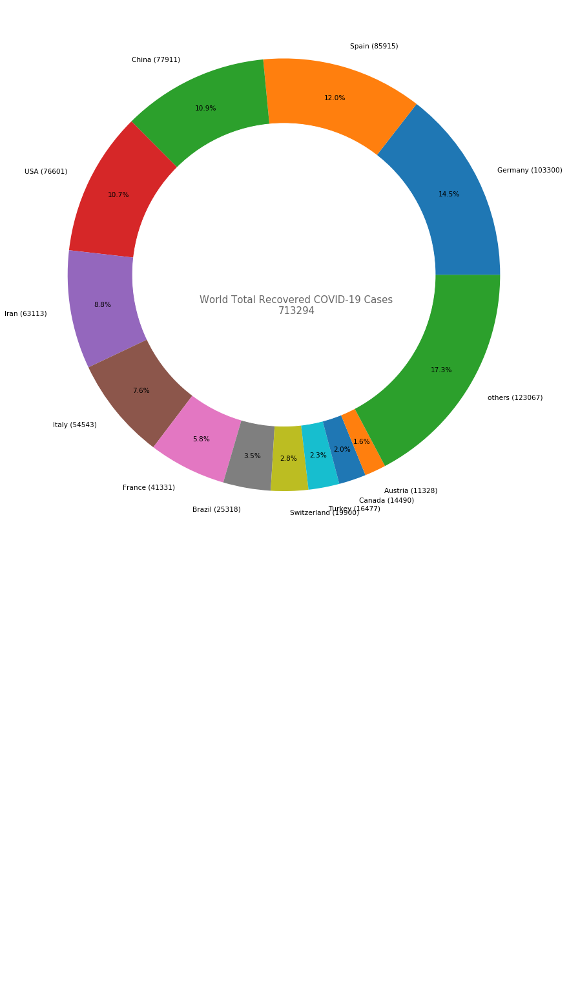

In [75]:
#rows = 4
f = plt.figure(figsize=(15,15*rows))

stats = [df_covid19.loc[:,['country','Recovered']]]
label = ["Recovered"]
threshold = [10000]
for i, stat in enumerate(stats):
    plt.tight_layout()
    df_countries = stat.groupby(["country"]).sum()
    df_countries = df_countries.sort_values(df_countries.columns[-1],ascending= False)
    others = df_countries[df_countries[df_countries.columns[-1]] < threshold[i] ].sum()[-1]
    df_countries = df_countries[df_countries[df_countries.columns[-1]] > threshold[i]]
    df_countries = df_countries[df_countries.columns[-1]]
    df_countries["others"] = others
    labels = [df_countries.index[i] +" (" + str(int(df_countries[i])) +") "for i in range(df_countries.shape[0])]

  #  ax = f.add_subplot(rows,1,i+1)
    plt.pie(df_countries, labels=labels,autopct='%1.1f%%',pctdistance=0.85, labeldistance=1.1,textprops = {'fontsize':10.5})
    my_circle=plt.Circle( (0,0), 0.7, color='white')
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.text(0.25,1.48,"World Total "+label[i]+ " COVID-19 Cases\n"+str(stat.sum().values[1]), horizontalalignment='center',verticalalignment='center',transform=ax.transAxes, size=15, alpha = 0.6)


plt.show()

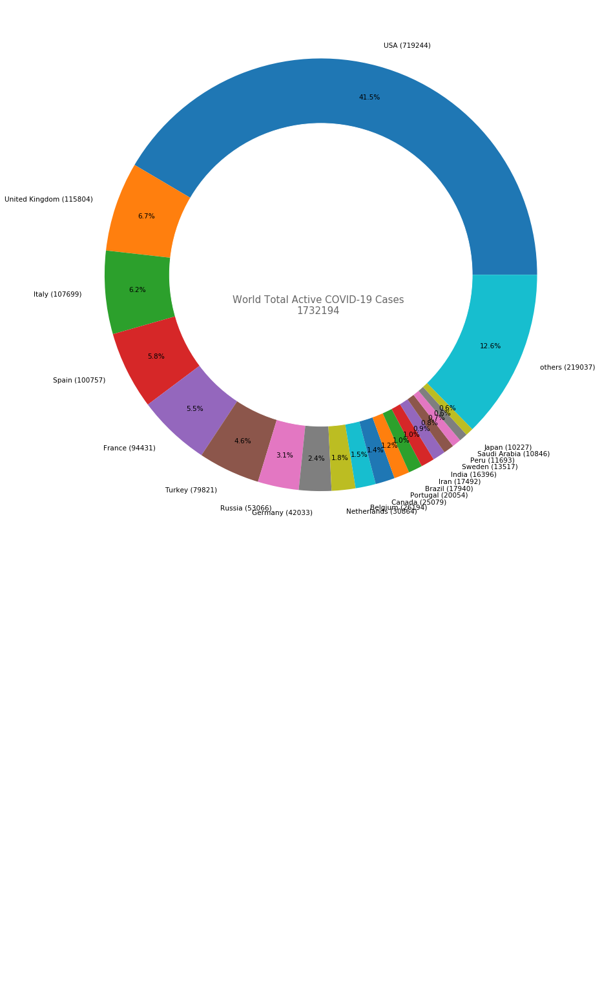

In [79]:
#rows = 4
f = plt.figure(figsize=(15,15*rows))

stats = [df_covid19.loc[:,['country','Active']]]
label = ["Active"]
threshold = [10000]
for i, stat in enumerate(stats):
    plt.tight_layout()
    df_countries = stat.groupby(["country"]).sum()
    df_countries = df_countries.sort_values(df_countries.columns[-1],ascending= False)
    others = df_countries[df_countries[df_countries.columns[-1]] < threshold[i] ].sum()[-1]
    df_countries = df_countries[df_countries[df_countries.columns[-1]] > threshold[i]]
    df_countries = df_countries[df_countries.columns[-1]]
    df_countries["others"] = others
    labels = [df_countries.index[i] +" (" + str(int(df_countries[i])) +") "for i in range(df_countries.shape[0])]

  #  ax = f.add_subplot(rows,1,i+1)
    plt.pie(df_countries, labels=labels,autopct='%1.1f%%',pctdistance=0.85, labeldistance=1.1,textprops = {'fontsize':10.5})
    my_circle=plt.Circle( (0,0), 0.7, color='white')
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.text(0.28,1.48,"World Total "+label[i]+ " COVID-19 Cases\n"+str(stat.sum().values[1]), horizontalalignment='center',verticalalignment='center',transform=ax.transAxes, size=15, alpha = 0.6)


plt.show()

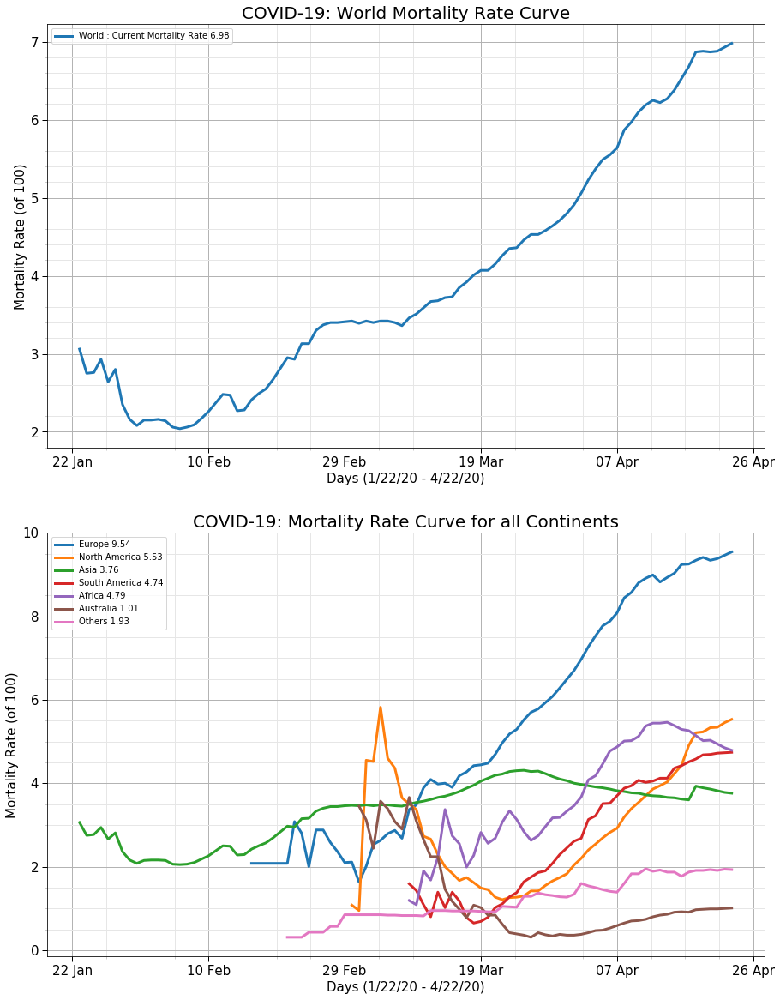

In [80]:
#Mortality
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index
continents = ["All"]+list(continents)

cols =1
rows = 2
axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","Mortality Rate (of 100)"]

f = plt.figure(figsize=(15,10*rows))

#Mortality rate globally
ax = f.add_subplot(211)
mortality_rate = get_mortality_rate(df_confirmed,df_deaths,continent=continents[0])
plt.plot(np.arange(1,mortality_rate.shape[0]+1),mortality_rate,label = "World : Current Mortality Rate "+str(mortality_rate[-1]),linewidth=3)

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

plt_title = "COVID-19: World Mortality Rate Curve"
plot_params(ax,axis_label,plt_title)
# Legend Location
l = plt.legend(loc= "best")


#Mortality rate for all continents
ax = f.add_subplot(212)
for i, continent in enumerate(continents[1:]):
    mortality_rate = get_mortality_rate(df_confirmed,df_deaths,continent=continent)
#     mortality_rate = mortality_rate.replace(np.nan, 0, regex=True)
    plt.plot(np.arange(1+mortality_rate[mortality_rate == 0].shape[0],mortality_rate[mortality_rate == 0].shape[0]+mortality_rate[mortality_rate > 0].shape[0]+1),mortality_rate[mortality_rate > 0],label = continents[i+1]+" "+str(mortality_rate[-1]),linewidth=3)

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])
    
plt_title = "COVID-19: Mortality Rate Curve for all Continents"
plot_params(ax,axis_label,plt_title)

# Legend Location
l = plt.legend(loc= "best")

plt.minorticks_on()
plt.savefig(out+'Mortality rate.png')
plt.show()


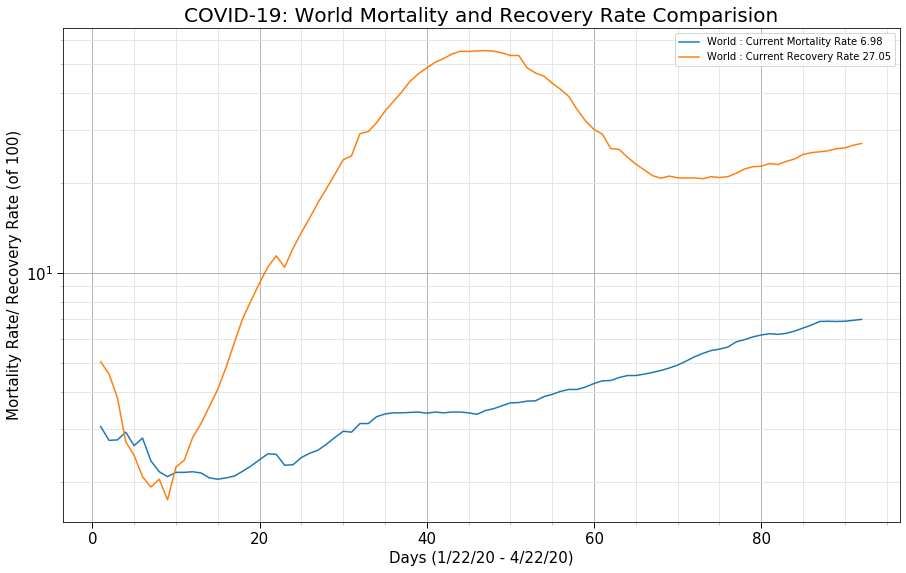

In [81]:
cols =1
rows = 2
axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","Mortality Rate/ Recovery Rate (of 100)"]

f = plt.figure(figsize=(15,10*rows))

# #SubPlot 1
ax = f.add_subplot(211)
mortality_rate = get_mortality_rate(df_confirmed,df_deaths,continent=continents[0])
recovered_rate = get_mortality_rate(df_confirmed,df_recovered,continent=continents[0])
plt.plot(np.arange(1,mortality_rate.shape[0]+1),mortality_rate,label = "World : Current Mortality Rate "+str(mortality_rate[-1]))
plt.plot(np.arange(1,recovered_rate.shape[0]+1),recovered_rate,label = "World : Current Recovery Rate "+str(recovered_rate[-1]))

plt_title = "COVID-19: World Mortality and Recovery Rate Comparision"
plot_params(ax,axis_label,plt_title,scale = "log")
# Legend Location
l = plt.legend(loc= "best")
plt.minorticks_on()
#plt.savefig(out+'Mortality rate.png')
plt.show()

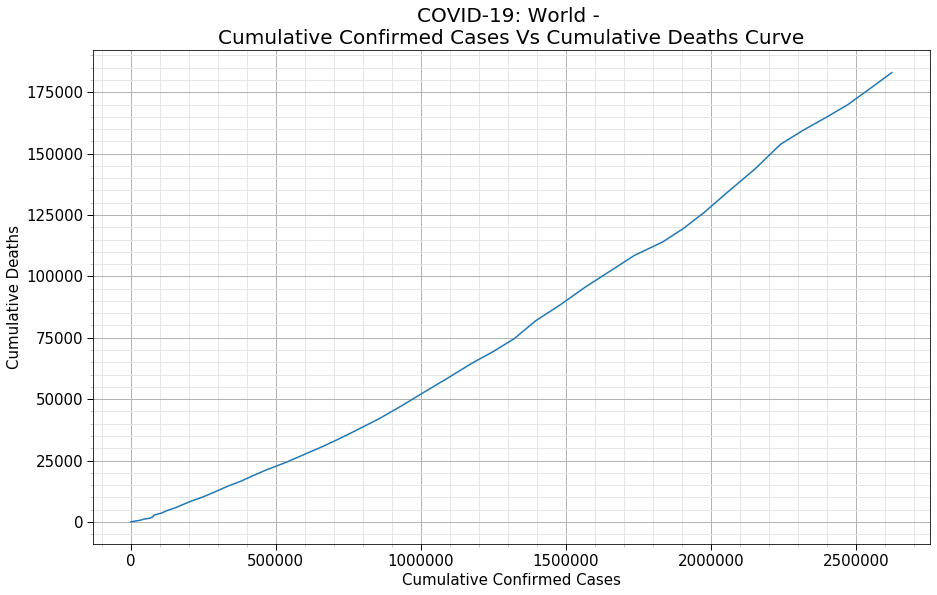

In [82]:
cols =1
rows = 2

f = plt.figure(figsize=(15,10*rows))

#Cases Vs Deaths
ax = f.add_subplot(211)
plt.plot(np.sum(np.asarray(df_confirmed.iloc[:,5:]),axis = 0),np.sum(np.asarray(df_deaths.iloc[:,5:]),axis = 0))

axis_label = ["Cumulative Confirmed Cases","Cumulative Deaths"]
plt_title = "COVID-19: World - \nCumulative Confirmed Cases Vs Cumulative Deaths Curve"
plot_params(ax,axis_label,plt_title)


# # SubPlot 2
# ax = f.add_subplot(212)
# mortality_rate = get_mortality_rate(df_confirmed,df_deaths,continent=continents[0])
# plt.plot(np.sum(np.asarray(df_recovered.iloc[:,5:]),axis = 0),np.sum(np.asarray(df_deaths.iloc[:,5:]),axis = 0))

# axis_label = ["Cumulative Recoveries","Cumulative Deaths"]
# plt_title = "COVID-19: World - Cumulative Recovery Vs Cumulative Deaths Curve"

# plot_params(ax,axis_label,plt_title)
plt.minorticks_on()
plt.savefig(out+'Cumulative Confirmed Cases Vs Cumulative Deaths Curve.png')
plt.show()

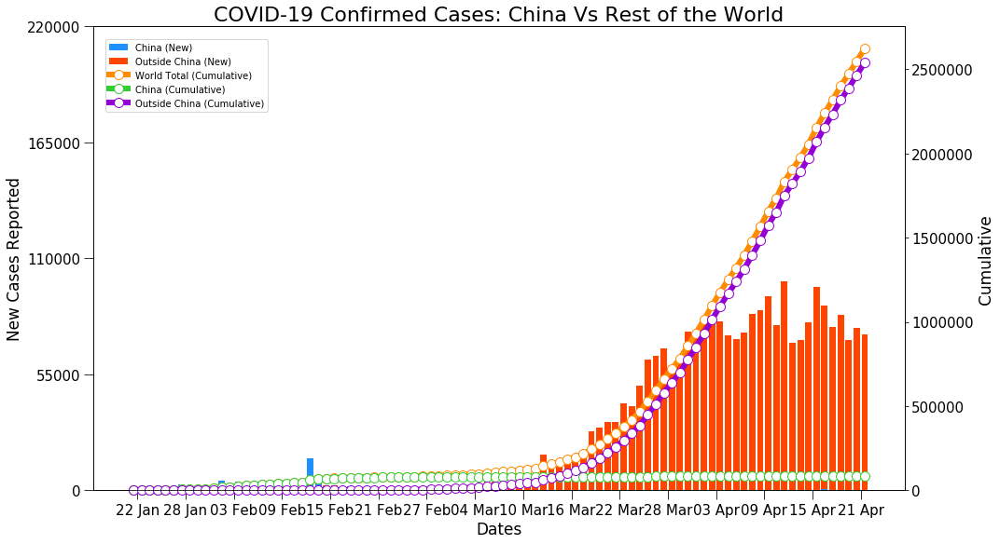

In [83]:
# Getting data for China and Outside China
# df - Cumulative data for china, outside china and world total  (confirmed cases)
# df_newcases- new cases reported per day  (confirmed cases)
df_confirmed_report = df_confirmed.copy()
df_confirmed_report.loc[df_confirmed_report['country'] != "China","country"] = "Outside China"
df_confirmed_report = df_confirmed_report.groupby("country").sum().drop(["Lat","Long"],axis =1)
df_confirmed_report.loc["Total"] = df_confirmed_report.sum()
df_confirmed_newcases = df_confirmed_report.groupby(level =0).diff(axis =1)
df_confirmed_newcases = df_confirmed_newcases.replace(np.nan, 0, regex=True) 
f = plt.figure(figsize=(15,8))
ax1 = f.add_subplot(111)

ax1.bar(df_confirmed_report[df_confirmed_report.index == "China"].columns,df_confirmed_newcases[df_confirmed_newcases.index == "China"].values[0], label = "China (New)",color='dodgerblue')
ax1.bar(df_confirmed_report[df_confirmed_report.index == "Outside China"].columns,df_confirmed_newcases[df_confirmed_newcases.index == "Outside China"].values[0],bottom=df_confirmed_newcases[df_confirmed_newcases.index == "China"].values[0],label = "Outside China (New)",color='orangered')

# Labels
ax1.set_xlabel("Dates",fontsize=17)
ax1.set_ylabel("New Cases Reported",fontsize =17)

ax1.tick_params(size=10,labelsize=15)
ax1.set_xticks(np.arange(0.5, len(df_confirmed_report.columns), 6))
ax1.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_confirmed_report.columns][::6],fontsize=15)
l = np.arange(0, df_confirmed_report.max(axis = 1)[2]/10+10000, 5000)
ax1.set_yticks(l[::int(len(l)/5)])
# ax1.spines['bottom'].set_position('zero')

ax2 = ax1.twinx()
marker_style = dict(linewidth=6, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')

ax2.plot(df_confirmed_report[df_confirmed_report.index == "Total"].columns ,df_confirmed_report[df_confirmed_report.index == "Total"].values[0],**marker_style,label = "World Total (Cumulative)",color="darkorange",clip_on=False)
ax2.plot(df_confirmed_report[df_confirmed_report.index == "China"].columns ,df_confirmed_report[df_confirmed_report.index == "China"].values[0],**marker_style,label = "China (Cumulative)",color="limegreen",clip_on=False)
ax2.plot(df_confirmed_report[df_confirmed_report.index == "Outside China"].columns ,df_confirmed_report[df_confirmed_report.index == "Outside China"].values[0],**marker_style,label ="Outside China (Cumulative)",color="darkviolet",clip_on=False)
ax2.bar([0],[0])

# Label
ax2.tick_params(labelsize=15)
ax2.set_ylabel("Cumulative",fontsize =17)
ax2.set_xticks(np.arange(0.5, len(df_confirmed_report.columns), 6))
ax2.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_confirmed_report.columns][::6])
l = np.arange(0, df_confirmed_report.max(axis = 1)[2]+100000, 100000)
ax2.set_yticks(l[::int(len(l)/5)])

f.tight_layout()
f.legend(loc = "upper left", bbox_to_anchor=(0.1,0.95))
plt.title("COVID-19 Confirmed Cases: China Vs Rest of the World",fontsize = 22)
plt.savefig(out+'China vs Rest of the world.png')
plt.show()

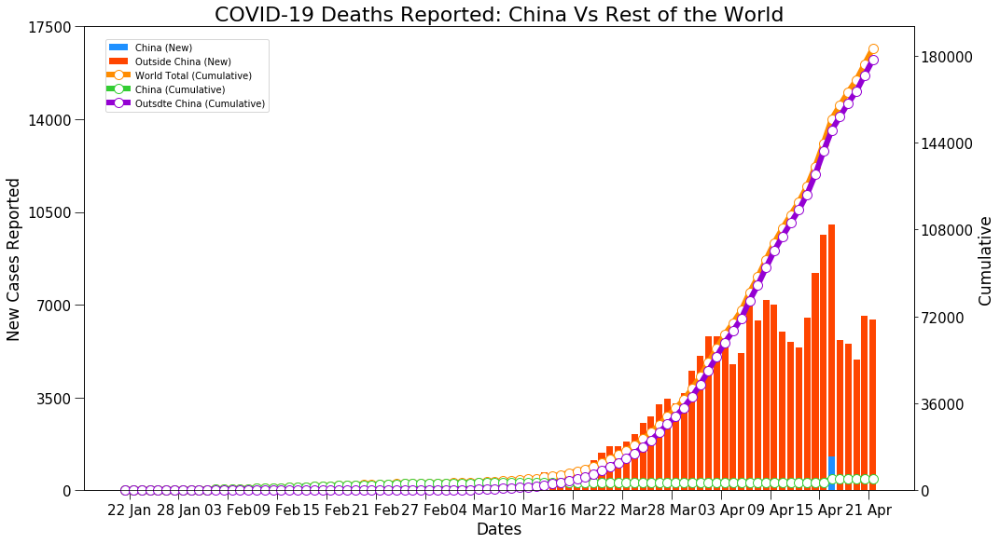

In [84]:
# Getting data for China and Oouside China
# df - Cumulative data for china, outside china and world total (deaths)
# df_newcases- new cases reported per day (deaths)
df_deaths_report = df_deaths.copy()
df_deaths_report.loc[df_deaths_report['country'] != "China","country"] = "Outside China"
df_deaths_report = df_deaths_report.groupby("country").sum().drop(["Lat","Long"],axis =1)
df_deaths_report.loc["Total"] = df_deaths_report.sum()
df_deaths_newcases = df_deaths_report.groupby(level =0).diff(axis =1)
df_deaths_newcases = df_deaths_newcases.replace(np.nan, 0, regex=True)

f = plt.figure(figsize=(15,8))
ax1 = f.add_subplot(111)

ax1.bar(df_deaths_report[df_deaths_report.index == "China"].columns,df_deaths_newcases[df_deaths_newcases.index == "China"].values[0], label = "China (New)",color='dodgerblue')
ax1.bar(df_deaths_report[df_deaths_report.index == "Outside China"].columns,df_deaths_newcases[df_deaths_newcases.index == "Outside China"].values[0],bottom=df_deaths_newcases[df_deaths_newcases.index == "China"].values[0],label = "Outside China (New)",color='orangered')

# Labels
ax1.set_xlabel("Dates",fontsize=17)
ax1.set_ylabel("New Cases Reported",fontsize =17)

ax1.tick_params(size=10,labelsize=15)
ax1.set_xticks(np.arange(0.5, len(df_deaths_report.columns), 6))
ax1.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_deaths_report.columns][::6],fontsize=15)
l = np.arange(0, df_deaths_report.max(axis = 1)[2]/10+500, 500)
ax1.set_yticks(l[::int(len(l)/5)])
# ax1.spines['bottom'].set_position('zero')

ax2 = ax1.twinx()
marker_style = dict(linewidth=6, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')

ax2.plot(df_deaths_report[df_deaths_report.index == "Total"].columns ,df_deaths_report[df_deaths_report.index == "Total"].values[0],**marker_style,label = "World Total (Cumulative)",color="darkorange",clip_on=False)
ax2.plot(df_deaths_report[df_deaths_report.index == "China"].columns ,df_deaths_report[df_deaths_report.index == "China"].values[0],**marker_style,label = "China (Cumulative)",color="limegreen",clip_on=False)
ax2.plot(df_deaths_report[df_deaths_report.index == "Outside China"].columns ,df_deaths_report[df_deaths_report.index == "Outside China"].values[0],**marker_style,label ="Outsdte China (Cumulative)",color="darkviolet",clip_on=False)
ax2.bar([0],[0])

# Label
ax2.tick_params(labelsize=15)
ax2.set_ylabel("Cumulative",fontsize =17)
ax2.set_xticks(np.arange(0.5, len(df_deaths_report.columns), 6))
ax2.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_deaths_report.columns][::6])
l = np.arange(0, df_deaths_report.max(axis = 1)[2]+4000, 2000)
ax2.set_yticks(l[::int(len(l)/5)])

f.tight_layout()
f.legend(loc = "upper left", bbox_to_anchor=(0.1,0.95))
plt.title("COVID-19 Deaths Reported: China Vs Rest of the World",fontsize = 22)
plt.savefig(out+'China vs Rest of the world1.png')
plt.show()


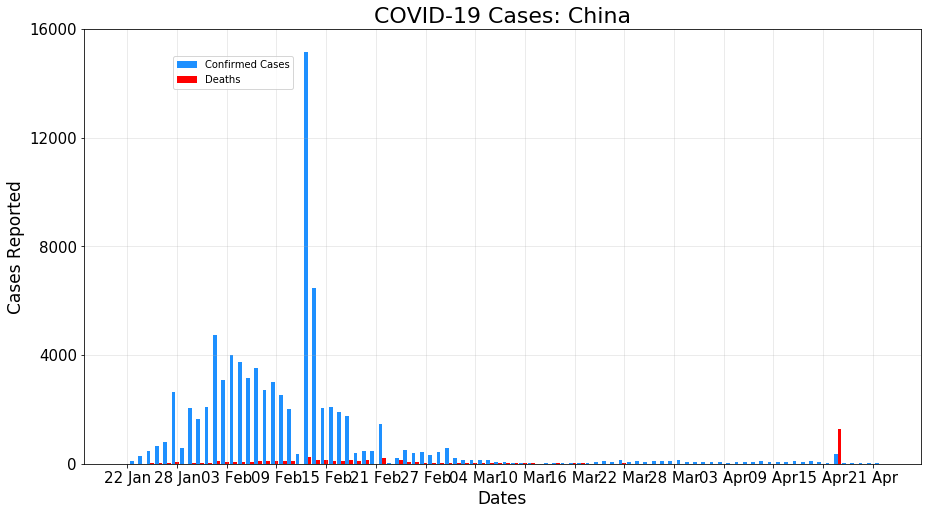

In [85]:
f = plt.figure(figsize=(15,8))
ax = f.add_subplot(111)

ax.bar(0.05+np.arange(len(df_confirmed_newcases[df_confirmed_newcases.index == "China"].columns)),df_confirmed_newcases[df_confirmed_newcases.index == "China"].values[0], label = "Confirmed Cases",color='dodgerblue',width = 0.45)
ax.bar(0.5+np.arange(len(df_deaths_newcases[df_deaths_newcases.index == "China"].columns)),df_deaths_newcases[df_deaths_newcases.index == "China"].values[0], label = "Deaths",color='red',width = 0.45)
# ax.bar(0.67+np.arange(len(df_recovered_newcases[df_recovered_newcases.index == "China"].columns)),df_recovered_newcases[df_recovered_newcases.index == "China"].values[0], label = "Recoveries",color='orange',width = 0.33)

# ax.bar(df_recovered_report[df_recovered_report.index == "Outside China"].columns,df_newcases[df_newcases.index == "Outside China"].values[0],bottom=df_newcases[df_newcases.index == "China"].values[0],label = "Outside China (New)",color='orangered')

# Labels
ax.set_xlabel("Dates",fontsize=17)
ax.set_ylabel("Cases Reported",fontsize =17)

ax.tick_params(labelsize=15)
ax.set_xticks(np.arange(0.5, len(df_confirmed_newcases.columns), 6))
ax.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_confirmed_newcases.columns][::6],fontsize=15)
ax.set_yticks(np.arange(0, df_confirmed_newcases.loc["China"].max()+4000, 4000))
ax.legend(loc = "upper left", bbox_to_anchor=(0.1,0.95))
plt.title("COVID-19 Cases: China",fontsize = 22)
plt.grid(alpha = 0.3)
plt.savefig(out+'China vs Rest of the world3.png')
plt.show()


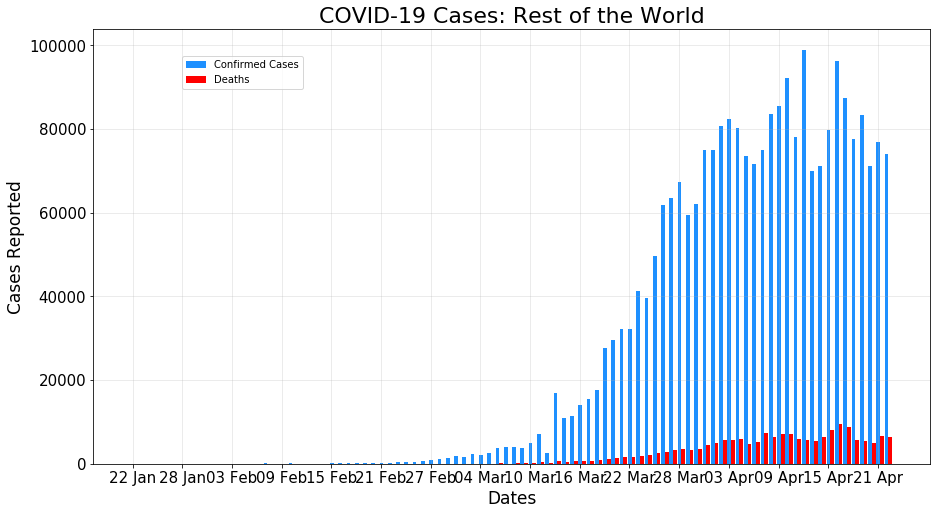

In [86]:
f = plt.figure(figsize=(15,8))
ax = f.add_subplot(111)

ax.bar(0.05+np.arange(len(df_confirmed_newcases[df_confirmed_newcases.index == "Outside China"].columns)),df_confirmed_newcases[df_confirmed_newcases.index == "Outside China"].values[0], label = "Confirmed Cases",color='dodgerblue',width = 0.45)
ax.bar(0.5+np.arange(len(df_deaths_newcases[df_deaths_newcases.index == "Outside China"].columns)),df_deaths_newcases[df_deaths_newcases.index == "Outside China"].values[0], label = "Deaths",color='red',width = 0.45)
# ax.bar(0.67+np.arange(len(df_recovered_newcases[df_recovered_newcases.index == "Outside China"].columns)),df_recovered_newcases[df_recovered_newcases.index == "Outside China"].values[0], label = "Recoveries",color='orange',width = 0.33)

# ax.bar(df_recovered_report[df_recovered_report.index == "Outside China"].columns,df_newcases[df_newcases.index == "Outside China"].values[0],bottom=df_newcases[df_newcases.index == "China"].values[0],label = "Outside China (New)",color='orangered')

# Labels
ax.set_xlabel("Dates",fontsize=17)
ax.set_ylabel("Cases Reported",fontsize =17)

ax.tick_params(labelsize=15)
ax.set_xticks(np.arange(0, len(df_confirmed_newcases.columns), 6))
ax.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_confirmed_newcases.columns][::6],fontsize=15)
ax.set_yticks(np.arange(0, df_confirmed_newcases.loc["Outside China"].max()+10000, 20000))
ax.legend(loc = "upper left", bbox_to_anchor=(0.1,0.95))
plt.title("COVID-19 Cases: Rest of the World",fontsize = 22)
plt.grid(alpha = 0.3)
plt.savefig(out+'China vs Rest of the world4.png')
plt.show()


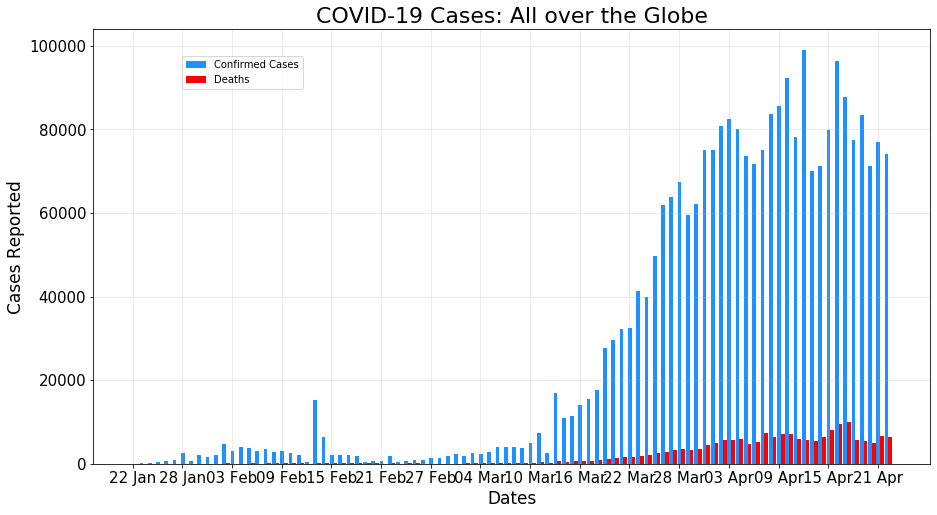

In [87]:
f = plt.figure(figsize=(15,8))
ax = f.add_subplot(111)

ax.bar(0.05+np.arange(len(df_confirmed_newcases[df_confirmed_newcases.index == "Total"].columns)),df_confirmed_newcases[df_confirmed_newcases.index == "Total"].values[0], label = "Confirmed Cases",color='dodgerblue',width = 0.45)
ax.bar(0.5+np.arange(len(df_deaths_newcases[df_deaths_newcases.index == "Total"].columns)),df_deaths_newcases[df_deaths_newcases.index == "Total"].values[0], label = "Deaths",color='red',width = 0.45)
# ax.bar(0.67+np.arange(len(df_recovered_newcases[df_recovered_newcases.index == "Total"].columns)),df_recovered_newcases[df_recovered_newcases.index == "Total"].values[0], label = "Recoveries",color='orange',width = 0.33)

# ax.bar(df_recovered_report[df_recovered_report.index == "Outside China"].columns,df_newcases[df_newcases.index == "Outside China"].values[0],bottom=df_newcases[df_newcases.index == "China"].values[0],label = "Outside China (New)",color='orangered')

# Labels
ax.set_xlabel("Dates",fontsize=17)
ax.set_ylabel("Cases Reported",fontsize =17)

ax.tick_params(labelsize=15)
ax.set_xticks(np.arange(0, len(df_confirmed_newcases.columns), 6))
ax.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_confirmed_newcases.columns][::6],fontsize=15)
ax.set_yticks(np.arange(0, df_confirmed_newcases.loc["Total"].max()+10000, 20000))
ax.legend(loc = "upper left", bbox_to_anchor=(0.1,0.95))
plt.title("COVID-19 Cases: All over the Globe",fontsize = 22)
plt.grid(alpha = 0.3)
plt.savefig(out+'China vs Rest of the world5.png')
plt.show()


In [88]:
#Test Analysis
df_test = pd.read_csv("https://raw.githubusercontent.com/SaloniGoradia/COVID-19-CaseStudy-and-Predictions/master/v53/test.csv")[:-1]

In [89]:
df_test.head(3)

,Entity,Date,Source URL,Source label,Notes,Cumulative total,Daily change in cumulative total,Cumulative total per million,Daily change in cumulative total per million,General source label,General source URL,Short description,Detailed description
0,Australia - units unclear,2/4/2020,https://www.covid19data.com.au/testing,Federal Department of Health,Most recent figure provided by Federal Departm...,261000,NaN,10276.32810,NaN,Australian Department for Health; State-level ...,https://www1.health.gov.au/internet/main/publi...,The source reports this data as the 'number of...,The Australian Department for Health publish w...
1,Austria - units unclear,3/4/2020,https://www.sozialministerium.at/Informationen...,Austrian Ministry for Health,NaN,98343,6153.0,11197.97864,700.620914,Austria Ministry for Health,https://www.sozialministerium.at/Informationen...,The source reports this data as the 'number of...,The Austrian Ministry for Health publishes dai...
2,Bahrain - units unclear,3/4/2020,https://www.moh.gov.bh/COVID19,Ministry of Health,NaN,37996,NaN,22380.01137,NaN,Bahrain Ministry of Health,https://www.moh.gov.bh/COVID19,The source reports the 'number of assessments'...,The Bahrainian Ministry of Health publishes fr...


In [90]:
df_test.drop(df_test[df_test["Entity"]=="India - people tested"].index[0],inplace=True)
df_test["country"] = [ c.split(" ")[0] for c in df_test["Entity"].values]
df_test.loc[17,"country"] ="USA"
df_test.loc[16,"country"] = "United Kingdom"
df_test.loc[15,"country"] = "South Korea"
df_test = df_test.loc[:,["country","Cumulative total","Cumulative total per million"]]

In [91]:
df_test["confirmed"] = [ df_countries_cases.loc[c,'Confirmed'] for c in df_test["country"].values]
df_test["deaths"] = [ df_countries_cases.loc[c,'Deaths'] for c in df_test["country"].values]
df_test["MR"] = np.round(100*df_test["deaths"]/df_test["confirmed"],2)
df_test["Positive"] = np.round(100*df_test["confirmed"]/df_test["Cumulative total"],2)
df_test.style.background_gradient(cmap='Blues',subset=["Cumulative total"])\
                        .background_gradient(cmap='Reds',subset=["Cumulative total per million"])\
                        .background_gradient(cmap='Greens',subset=["confirmed"])\
                        .background_gradient(cmap='Purples',subset=["deaths"])\
                        .background_gradient(cmap='YlOrBr',subset=["MR"])\
                        .background_gradient(cmap='bone_r',subset=["Positive"])

,country,Cumulative total,Cumulative total per million,confirmed,deaths,MR,Positive
0,Australia,261000,10276.328100,6547,67,1.020000,2.510000
1,Austria,98343,11197.978640,14925,510,3.420000,15.180000
2,Bahrain,37996,22380.011370,2027,7,0.350000,5.330000
3,Belgium,62867,5410.254001,41889,6262,14.950000,66.630000
4,Canada,256933,6832.742050,41650,2081,5.000000,16.210000
5,France,224254,3412.203664,157135,21373,13.600000,70.070000
6,Germany,918460,11127.392690,150648,5315,3.530000,16.400000
8,India,47951,34.666771,21450,681,3.170000,44.730000
9,Indonesia,7621,27.995432,7418,635,8.560000,97.340000
10,Italy,581232,9829.386499,187327,25085,13.390000,32.230000


In [92]:
df_test.corr().style.background_gradient(cmap='Blues').format("{:.2f}")

,Cumulative total,Cumulative total per million,confirmed,deaths,MR,Positive
Cumulative total,1.00,0.20,0.83,0.73,0.03,-0.12
Cumulative total per million,0.20,1.00,-0.05,-0.06,-0.23,-0.59
confirmed,0.83,-0.05,1.00,0.92,0.19,0.20
deaths,0.73,-0.06,0.92,1.00,0.49,0.28
MR,0.03,-0.23,0.19,0.49,1.00,0.59
Positive,-0.12,-0.59,0.20,0.28,0.59,1.00


In [93]:
fig = px.bar(df_test.sort_values("Cumulative total"),
            x='country', y="Cumulative total",
            text = "MR",
            hover_name="country",
            hover_data=["confirmed","deaths","Cumulative total","Positive"],
            title='COVID-19: Tests Over Countries',
)
fig.update_xaxes(title_text="Country")
fig.update_yaxes(title_text="Number of Tests (Text on bars is MR %)")
fig.show()


In [94]:
fig = px.bar(df_test.sort_values("Positive"),
            x='country', y="Positive",
            text = "MR",
            hover_name="country",
            hover_data=["confirmed","deaths","Cumulative total","Positive"],
            title='COVID-19: Test(Positive) Over Countries',
)
fig.update_xaxes(title_text="Country")
fig.update_yaxes(title_text="Positive Tests(%)- (Text on bars is MR %)")
fig.show()

In [95]:
fig = px.bar(df_test.sort_values("MR"),
            x='country', y="MR",
            text = "Positive",
            hover_name="country",
            hover_data=["confirmed","deaths","Cumulative total","Positive"],
            title='COVID-19: MR Over Countries',
)
fig.update_xaxes(title_text="Country")
fig.update_yaxes(title_text="MR(%)- (Text on bars is Positive %)")
fig.show()

In [96]:
fig = px.bar(df_test.sort_values("Cumulative total per million"),
            x='country', y="Cumulative total per million",
            text = "MR",
            hover_name="country",
            hover_data=["confirmed","deaths","Cumulative total","Positive"],
            title='COVID-19: Tests per million Over Countries',
)
fig.update_xaxes(title_text="Country")
fig.update_yaxes(title_text="Tests per million(%)- (Text on bars is MR %)")
fig.show()

In [97]:
fig = px.scatter(df_test, y=df_test.loc[:,"MR"],
                    x= df_test.loc[:,"Positive"],
                    color= "country", hover_name="country",
                    hover_data=["confirmed","deaths","Cumulative total"],
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title='COVID-19: Test(Positive) vs Mortality rate',
                    size = np.power(df_test["confirmed"]+1,0.3)-0.5,
                    size_max = 30,
                    height =600,
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.update_yaxes(title_text="Mortality Rate (%)")
fig.update_xaxes(title_text="Tests Positive (%)")
fig.show()

In [98]:
#USA data

date_usa = datetime.strptime(df_confirmed.columns[-1],'%m/%d/%y').strftime("%m-%d-%Y")
df_temp = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/"+date_usa+".csv")
df_usa = df_temp.loc[df_temp["Country_Region"]== "US"]
df_usa = df_usa.rename(columns={"Admin2":"County"})

In [177]:
df_usa.drop(['Recovered'],axis=1)

,FIPS,County,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Active,Combined_Key
0,45001.0,Abbeville,South Carolina,US,2020-04-22 23:30:53,34.223334,-82.461707,22,0,22,"Abbeville, South Carolina, US"
1,22001.0,Acadia,Louisiana,US,2020-04-22 23:30:53,30.295065,-92.414197,117,7,110,"Acadia, Louisiana, US"
2,51001.0,Accomack,Virginia,US,2020-04-22 23:30:53,37.767072,-75.632346,59,1,58,"Accomack, Virginia, US"
3,16001.0,Ada,Idaho,US,2020-04-22 23:30:53,43.452658,-116.241552,622,12,610,"Ada, Idaho, US"
4,19001.0,Adair,Iowa,US,2020-04-22 23:30:53,41.330756,-94.471059,1,0,1,"Adair, Iowa, US"
...,...,...,...,...,...,...,...,...,...,...,...
2854,66.0,0,Guam,US,2020-04-22 23:30:53,13.444300,144.793700,136,5,131,"Guam, US"
2881,69.0,0,Northern Mariana Islands,US,2020-04-22 23:30:53,15.097900,145.673900,14,2,12,"Northern Mariana Islands, US"
2887,72.0,0,Puerto Rico,US,2020-04-22 23:30:53,18.220800,-66.590100,1252,63,1189,"Puerto Rico, US"
2892,0.0,0,Recovered,US,2020-04-22 23:30:53,0.000000,0.000000,0,0,-77366,"Recovered, US"


In [178]:
total = df_usa.sum()
total.name = "Total"
pd.DataFrame(total).transpose().loc[:,["Confirmed","Deaths"]].style.background_gradient(cmap='Purples',axis=1)

,Confirmed,Deaths
Total,839675,46583


In [179]:
df_usa.loc[:,["Confirmed","Deaths","Province_State"]].groupby(["Province_State"]).sum().sort_values("Confirmed",ascending=False).style.background_gradient(cmap='Blues',subset=["Confirmed"]).background_gradient(cmap='Reds',subset=["Deaths"])

,Confirmed,Deaths
Province_State,,
New York,263292,19413
New Jersey,95914,5150
Massachusetts,42944,2182
California,37344,1421
Pennsylvania,36082,1673
Illinois,35107,1565
Michigan,33966,2813
Florida,28309,893
Louisiana,25258,1473


In [180]:
df_usa.loc[:,["Province_State","Confirmed","Deaths","County"]].sort_values("Confirmed",ascending=False).set_index("County")[:15].style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])

,Province_State,Confirmed,Deaths
County,,,
New York City,New York,147297,15074
Nassau,New York,31555,1431
Suffolk,New York,28854,926
Westchester,New York,25276,838
Cook,Illinois,24546,1072
Los Angeles,California,16447,732
Wayne,Michigan,14561,1319
Bergen,New Jersey,13686,876
Hudson,New Jersey,12088,657


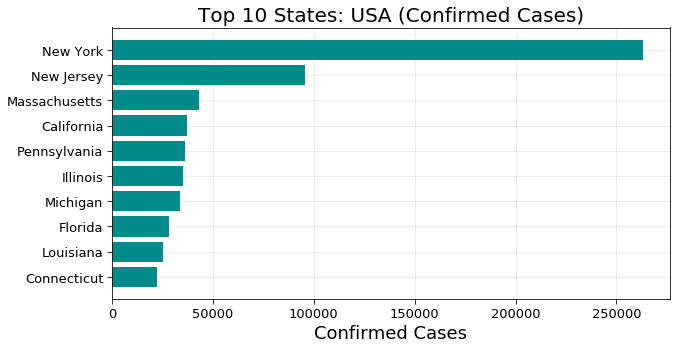

In [103]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_usa.groupby(["Province_State"]).sum().sort_values('Confirmed')["Confirmed"].index[-10:],df_usa.groupby(["Province_State"]).sum().sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 States: USA (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig(out+'Top 10 States_USA (Confirmed Cases).png')

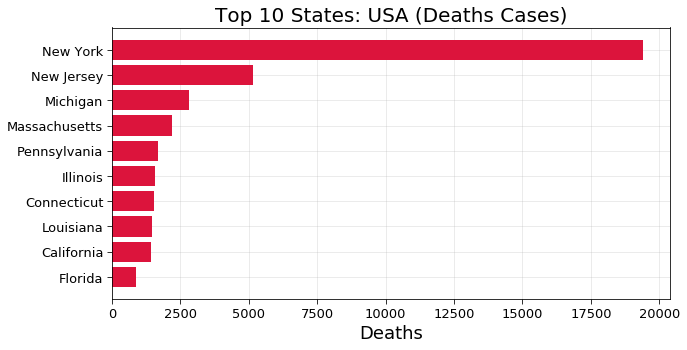

In [104]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_usa.groupby(["Province_State"]).sum().sort_values('Deaths')["Dreeaths"].index[-10:],df_usa.groupby(["Province_State"]).sum().sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths",fontsize=18)
plt.title("Top 10 States: USA (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig(out+'Top 10 States_USA (Deaths Cases).png')

In [181]:
#world map of USA
df_usa = df_usa.replace(np.nan, 0, regex=True)
usa = folium.Map(location=[37, -102], zoom_start=4,max_zoom=8,min_zoom=4)
for i in np.int32(np.asarray(df_usa[df_usa['Confirmed'] > 0].index)):
    folium.Circle(
        location=[df_usa.loc[i]['Lat'], df_usa.loc[i]['Long_']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_usa.loc[i]['Province_State']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_usa.loc[i]['County']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_usa.loc[i]['Confirmed'])+"</li>"+
        "<li>Active:   "+str(df_usa.loc[i]['Active'])+"</li>"+     
        "<li>Deaths:   "+str(df_usa.loc[i]['Deaths'])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_usa.loc[i]['Deaths']/(df_usa.loc[i]['Confirmed']+1)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=int((np.log2(df_usa.loc[i]['Confirmed']+1))*6000),
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(usa)

usa

In [106]:
state_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json').json()
county_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us_counties_20m_topo.json').json()

In [107]:
data_temp = df_usa.groupby(["Province_State"]).sum().reset_index().drop(["Lat","Long_"],axis=1)
data_temp["Confirmed_log"] = np.log10(data_temp["Confirmed"]+1)
bins = list(data_temp['Confirmed_log'].quantile([0, 0.25, 0.5, 0.75,0.95 ,1]))
m = folium.Map(location=[37, -102], zoom_start=4,max_zoom=6,min_zoom=3)
 
# Add the color for the chloropleth:
folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data = data_temp,
    columns=['Province_State', 'Confirmed_log'],
    key_on='feature.properties.name',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    bins = bins,
    reset=True,
    legend_name='Confirmed cases log (10^x)'
).add_to(m)
folium.LayerControl().add_to(m)

legend_html = "<div style='padding:10px;background-color:rgba(255,255,255,0.5);position:fixed;bottom:20px;left:20px;z-index:1000'>"
legend_html += "<div style='width:100%;text-align:center;'><h4>Index for Legend</h4></div><hr style='border-top-color: rgba(25,25,25,0.5);'>"
legend_html += "<ul style='margin:0;padding:0;color: #555;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"
for i in bins:
    legend_html += "<li style='margin:0;padding:0;line-height: 0;'>Value "+str(np.round(i,2))+" : "+str(int(10**i)-1)+"</li><br>"
legend_html += "</ul></div>"
m.get_root().html.add_child(folium.Element(legend_html))
m

In [108]:
# binsurl = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
# county_data = f'{url}/us_county_data.csv'
# county_geo = f'{url}/us_counties_20m_topo.json'

data_temp = df_usa.groupby(["FIPS"]).sum().reset_index().drop(["Lat","Long_"],axis=1)
data_temp["Confirmed_log"] = np.log10(data_temp["Confirmed"]+1)

df_usa_series = data_temp.set_index('FIPS')['Confirmed_log']
colorscale = branca.colormap.linear.Reds_09.scale(0,data_temp["Confirmed_log"].max()-1)
# print(df_usa_series.max())
def style_function(feature):
    employed = df_usa_series.get(int(feature['id'][-5:]), 0)
    return {
        'fillOpacity': 0.5,
        'weight': 0,
        'fillColor': '#black' if employed is None else colorscale(employed)
    }


m = folium.Map(
    location=[37, -102],
    tiles='cartodbpositron',
    zoom_start=4,
    min_zoom=3,
    max_zoom=7
)

folium.TopoJson(
    county_geo,
    'objects.us_counties_20m',
    style_function=style_function
).add_to(m)
m

In [182]:
df_age_gender = pd.read_csv(r"C:\Users\sgoradia\Desktop\Python\COVID-19_Cases_Summarized_by_Age_Group_and_Gender.csv")
df_age_gender

,Age Group,Gender,Confirmed Cases
0,81+,Female,41
1,81+,Male,33
2,18-30,Male,119
3,51-60,Female,75
4,under 18,Male,11
5,51-60,Male,138
6,31-40,Male,182
7,61-70,Male,88
8,under 18,Female,15
9,41-50,Female,82


In [196]:
df_sfo_age = df_age_gender.groupby(['Age Group']).sum().reset_index()
df_sfo_age

,Age Group,Confirmed Cases
0,18-30,204
1,31-40,290
2,41-50,239
3,51-60,213
4,61-70,152
5,71-80,83
6,81+,74
7,under 18,26


In [197]:
df_sfo_age.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Age Group        8 non-null      object
 1   Confirmed Cases  8 non-null      int64 
dtypes: int64(1), object(1)
memory usage: 256.0+ bytes


In [198]:
df_sfo_gender = df_age_gender.groupby(['Gender']).sum().reset_index()
df_sfo_gender

,Gender,Confirmed Cases
0,Female,512
1,Male,769


In [199]:
fig = px.bar(df_sfo_age, 
             y="Confirmed Cases", x="Age Group", color='Age Group', 
             log_y=False, template='ggplot2', title='Age distribution in SFO')
fig.show()

In [200]:
fig = px.pie(df_sfo_age,
             values="Confirmed Cases",
             names="Age Group",
             template="seaborn")
fig.update_traces(rotation=90, pull=0.05, textinfo="value+label")
fig.show()

In [201]:
fig = px.pie(df_sfo_gender,
             values="Confirmed Cases",
             names="Gender",
             template="seaborn")
fig.update_traces(rotation=90, pull=0.05, textinfo="value+label")
fig.show()

In [115]:
nRowsRead = 1000

In [116]:
df_county = pd.read_csv( "https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv")

In [117]:
df_county.head(10)

,date,county,state,fips,cases,deaths
0,2020-01-21,Snohomish,Washington,53061.0,1,0
1,2020-01-22,Snohomish,Washington,53061.0,1,0
2,2020-01-23,Snohomish,Washington,53061.0,1,0
3,2020-01-24,Cook,Illinois,17031.0,1,0
4,2020-01-24,Snohomish,Washington,53061.0,1,0
5,2020-01-25,Orange,California,6059.0,1,0
6,2020-01-25,Cook,Illinois,17031.0,1,0
7,2020-01-25,Snohomish,Washington,53061.0,1,0
8,2020-01-26,Maricopa,Arizona,4013.0,1,0
9,2020-01-26,Los Angeles,California,6037.0,1,0


In [118]:
df_county.corr().index

Index(['fips', 'cases', 'deaths'], dtype='object')

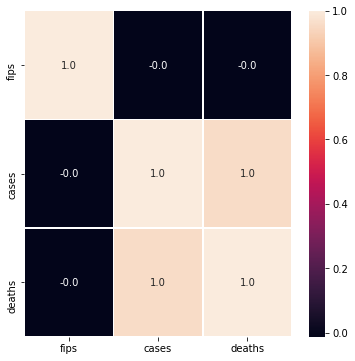

In [119]:
#correlation map
f,ax = plt.subplots(figsize=(6, 6))
sns.heatmap(df_county.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
plt.show()

In [120]:
#For time series data, it is convenient to use line diagrams
df2 = df_county.groupby(['date']).sum()


In [121]:
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.graph_objs as go

# Creating trace1
trace1 = go.Scatter(
                    x = df2.index,
                    y = df2.cases,
                    mode = "lines+markers",
                    name = "Cases",
                    marker = dict(color = 'rgba(16, 112, 2, 0.8)'))
# Creating trace2
trace2 = go.Scatter(
                    x = df2.index,
                    y = df2.deaths,
                    mode = "lines+markers",
                    name = "Deaths",
                    marker = dict(color = 'rgba(80, 26, 80, 0.8)'))
data = [trace1, trace2]
layout = dict(title = 'US Corona Cases and Deaths',
              xaxis= dict(title= 'Days',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

In [122]:
# Here is the top 10 states where covid-19 has most seen
df_hist = df_county[df_county.date == max(df_county.date)].groupby(['state']).sum().sort_values(by=['cases'],ascending=False).head(10)
states = df_hist.index.values


In [123]:
#Plotly bar graphic

# import graph objects as "go"
import plotly.graph_objs as go
# create trace1 
trace1 = go.Bar(
                x = df_hist.index,
                y = df_hist.cases,
                name = "Cases",
                marker = dict(color = 'rgba(0, 0, 255, 0.5)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))
# create trace2 
trace2 = go.Bar(
                x = df_hist.index,
                y = df_hist.deaths,
                name = "Deaths",
                marker = dict(color = 'rgba(255, 0, 0, 0.5)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
data = [trace1, trace2]
layout = go.Layout(barmode = "group")
fig = go.Figure(data = data, layout = layout)
iplot(fig)

In [124]:
df_for_states = df_county.groupby(["date","state"]).sum()
df_for_states.reset_index(inplace=True)

'''df_for_states.loc['2020-04-10']
df_for_states.index = range(1,len(df_for_states)+1,1)
df_for_states.head()'''
df_for_states = df_for_states[['date','state','cases','deaths']]
#Last 10 days and top 10 states
df_us_deaths =  df_for_states.pivot(index='date',columns='state',values='deaths').tail(10)
df_us_cases =  df_for_states.pivot(index='date',columns='state',values='cases').tail(10)

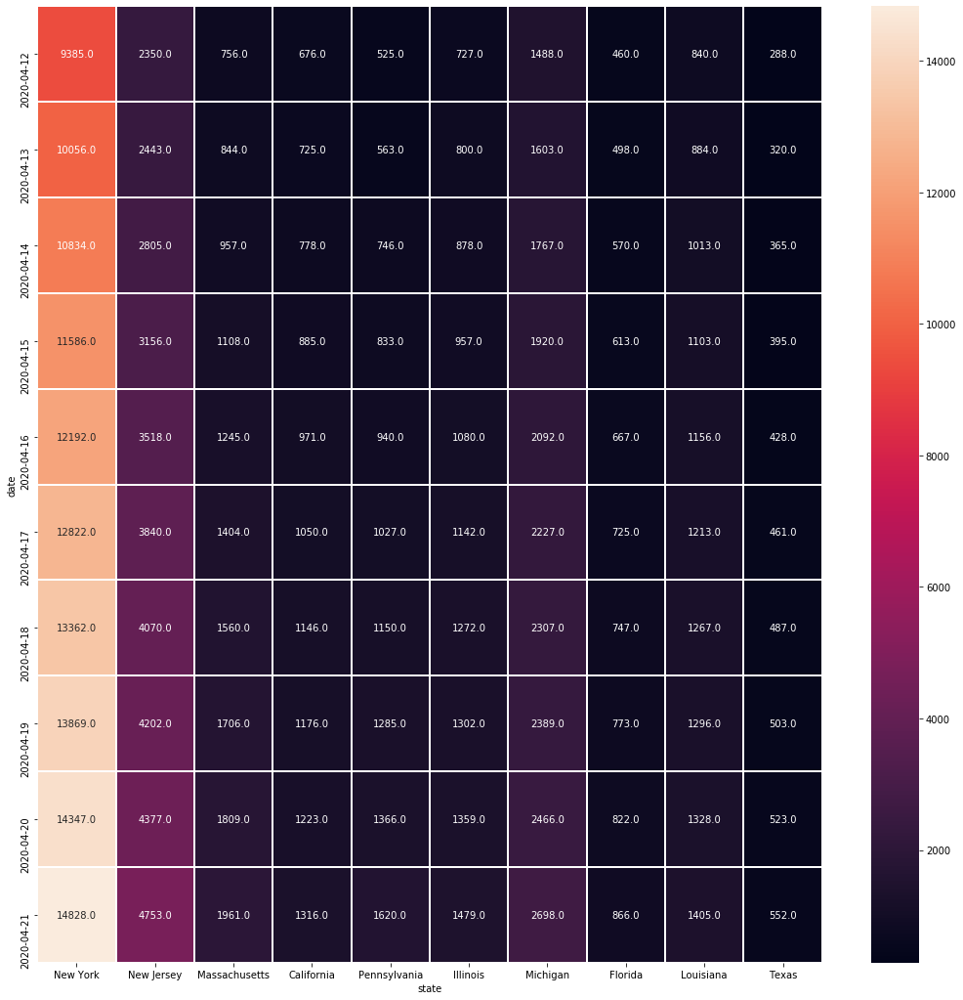

In [203]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(df_us_deaths[states], annot=True, linewidths=1, fmt= '.1f',ax=ax)
plt.show()

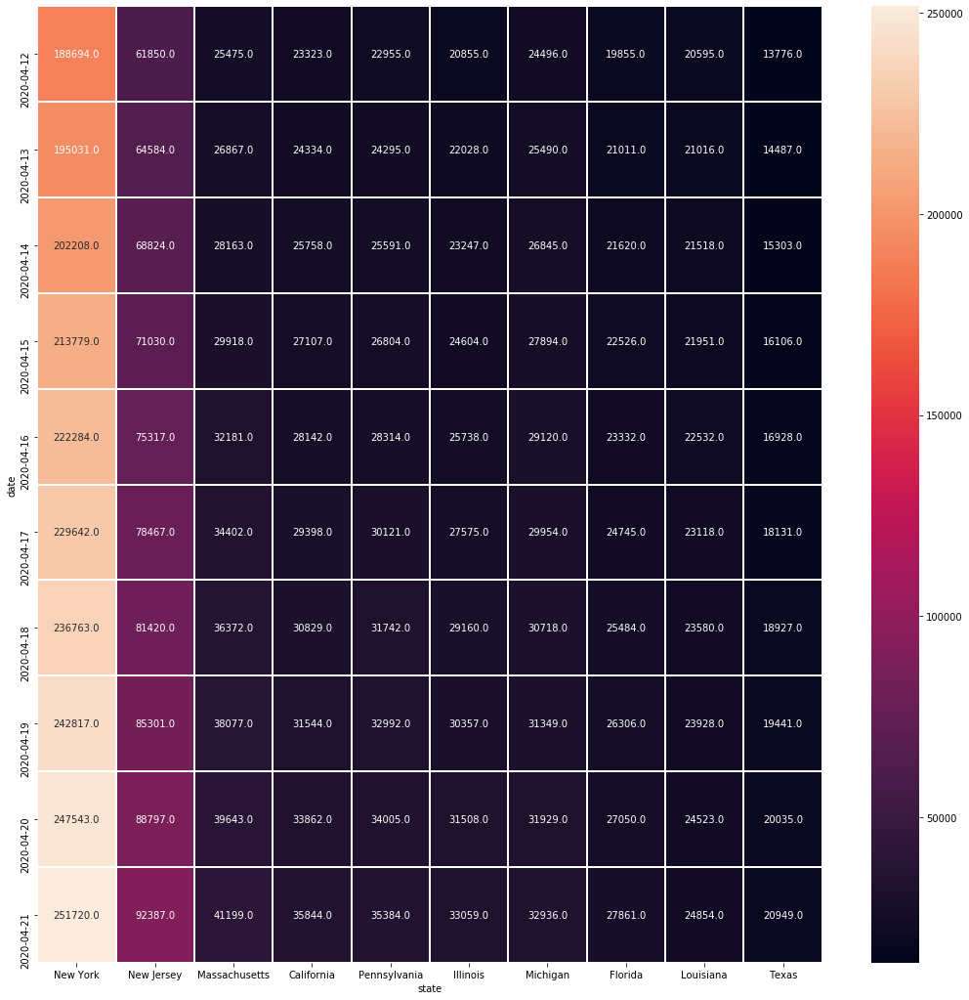

In [126]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(df_us_cases[states], annot=True, linewidths=1, fmt= '.1f',ax=ax)
plt.show()

In [127]:
df_california = df_county[df_county['state']=='California']
df_california.groupby(["date","county"]).sum()
ratio =[df_california['deaths']/df_california['cases']]
df_california['death_ratio'] = df_california['deaths']/df_california['cases']

In [128]:
df_california_last_day = df_california[df_california['date'] == max(df_california['date'])].sort_values(by=['cases'],ascending=False).head(10)

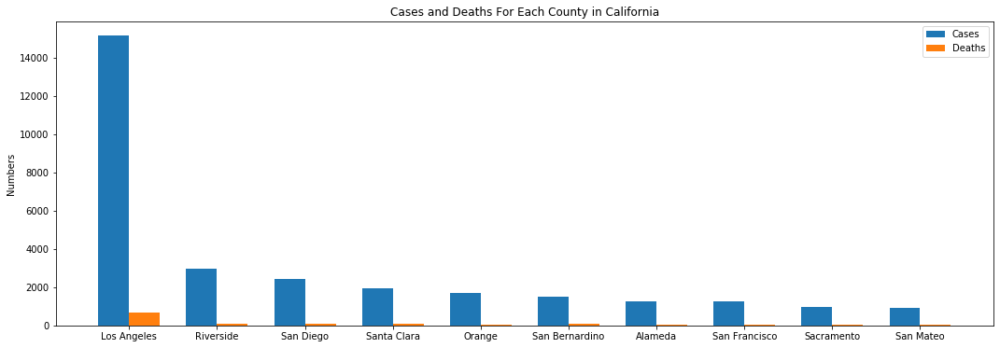

In [129]:
fig, ax = plt.subplots(figsize=(18,6))
x = np.arange(len(df_california_last_day['cases']))  # the label locations
width = 0.35
rects1 = ax.bar(x - width/2, df_california_last_day['cases'], width, label='Cases')
rects2 = ax.bar(x + width/2, df_california_last_day['deaths'], width, label='Deaths')
ax.set_ylabel('Numbers')
ax.set_title('Cases and Deaths For Each County in California')
ax.set_xticks(x)
ax.set_xticklabels(df_california_last_day['county'])
ax.legend()
plt.show()

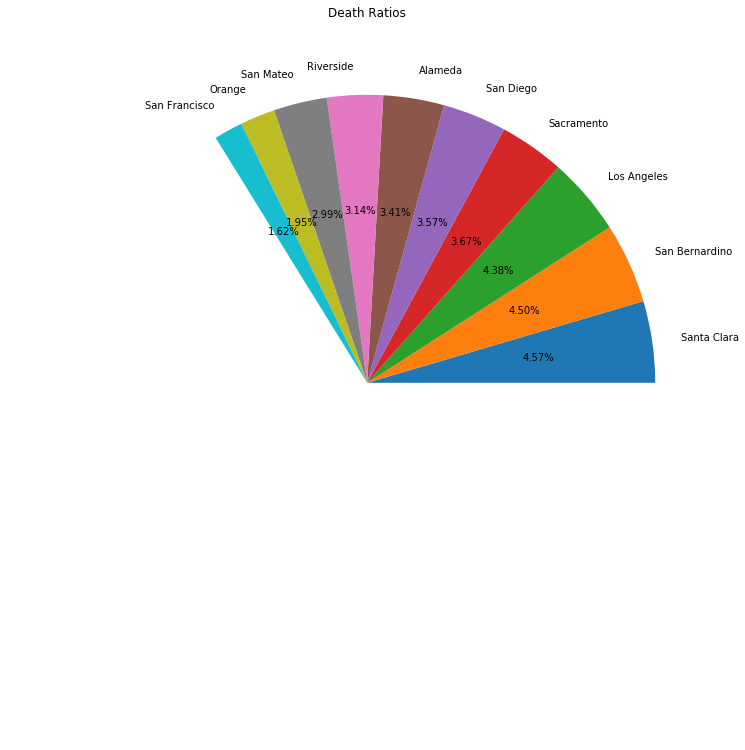

In [130]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_axes([0,0,1,1])
ax.axis('equal')
county = df_california_last_day.sort_values(by=['death_ratio'],ascending=False)['county']
death_ratio = df_california_last_day.sort_values(by=['death_ratio'],ascending=False)['death_ratio']
ax.pie(death_ratio, labels = county,autopct='%1.2f%%')
ax.set_title('Death Ratios')
plt.show()

In [131]:
df_cali = df_county[df_county.state == 'California']
df_bayarea= df_cali[(df_cali.county == 'Santa Clara') | (df_cali.county == 'San Francisco') | (df_cali.county == 'San Mateo') | (df_cali.county == 'Alameda')]

In [132]:
df_bayarea.groupby(["date","county"]).sum()
ratio1 =[df_bayarea['deaths']/df_bayarea['cases']]
df_bayarea['death_ratio'] = df_bayarea['deaths']/df_bayarea['cases']

In [133]:
df_bayarea.head(5)

,date,county,state,fips,cases,deaths,death_ratio
36,2020-01-31,Santa Clara,California,6085.0,1,0,0.0
42,2020-02-01,Santa Clara,California,6085.0,1,0,0.0
49,2020-02-02,San Francisco,California,6075.0,2,0,0.0
50,2020-02-02,Santa Clara,California,6085.0,2,0,0.0
57,2020-02-03,San Francisco,California,6075.0,2,0,0.0


In [134]:
import plotly.express as px
#cases in bay area
fig = px.line(df_bayarea, x="date", y="cases", color='county')
fig.show()

In [135]:
#deaths in bayarea
fig = px.line(df_bayarea, x="date", y="deaths", color='county')
fig.show()

In [136]:
#Prediction of Confirmed cases and deaths
# Visible = Input(shape=(1,))
# Dense_l1 = Dense(80,name="Dense_l1")(Visible)
# LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)
# Dense_l2 = Dense(80,name = "Dense_l2")(LRelu_l1)
# LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)
# Dense_l3 = Dense(1,name="Dense_l3")(LRelu_l2)
# LRelu_l3 = LeakyReLU(name = "Output")(Dense_l3)
# model = models.Model(inputs=Visible, outputs=LRelu_l3)
# model.compile(optimizer=Adam(lr=0.001), 
#               loss='mean_squared_error',
#               metrics=['accuracy'])
# model.summary()

In [137]:
# Prediction of Confirmed cases
data_y = np.log10(np.asarray(df_confirmed.sum()[5:]).astype("float32"))
data_x = np.arange(1,len(data_y)+1)

In [138]:
# epochs = 500
# model.fit(data_x.reshape([data_y.shape[0],1]),data_y.reshape([data_y.shape[0],1]),epochs=epochs)

In [139]:
# model.save('model_confirmed_v2.h5')

In [140]:
model = models.load_model("model_confirmed_v2.h5")
model.summary()


Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0  

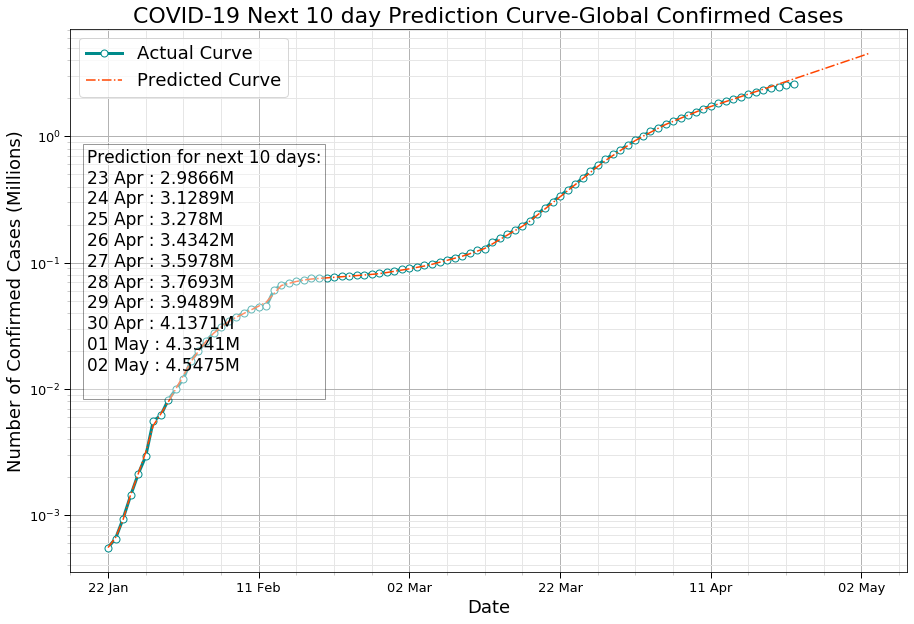

In [141]:
million = 1000000
prediction_days = 10
data = np.power(10,model.predict(np.arange(1,len(data_y)+prediction_days+1)))
temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)

date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/million,"-.",color="darkcyan",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/million,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total = d + nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-2)[0]/million)+"M\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),d[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve-Global Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases (Millions)",fontsize =18)

plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig(out+"Prediction Curve-Confirmed.png")
plt.show()

In [142]:
# Visible = Input(shape=(1,))
# Dense_l1 = Dense(80,name="Dense_l1")(Visible)
# LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)
# Dense_l2 = Dense(80,name = "Dense_l2")(LRelu_l1)
# LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)
# Dense_l3 = Dense(1,name="Dense_l3")(LRelu_l2)
# LRelu_l3 = LeakyReLU(name = "Output")(Dense_l3)
# model2 = models.Model(inputs=Visible, outputs=LRelu_l3)
# model2.compile(optimizer=Adam(lr=0.0001), 
#               loss='mean_squared_error',
#               metrics=['accuracy'])
# model2.summary()

In [143]:
# Prediction of deaths
data1_y = np.log10(np.asarray(df_deaths.sum()[5:-1]).astype("float32"))
data1_x = np.arange(1,len(data_y))

In [144]:
# epochs=2000
# model2.fit(data1_x.reshape([data1_y.shape[0],1]),data1_y.reshape([data1_y.shape[0],1]),epochs=epochs)
# model2.save('model_deaths_v2.h5')

In [145]:
model2 = models.load_model("model_deaths.h5")
model2.summary()

Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 1)                 81        
_________________________________________________________________
Output (LeakyReLU)           (None, 1)                 0  

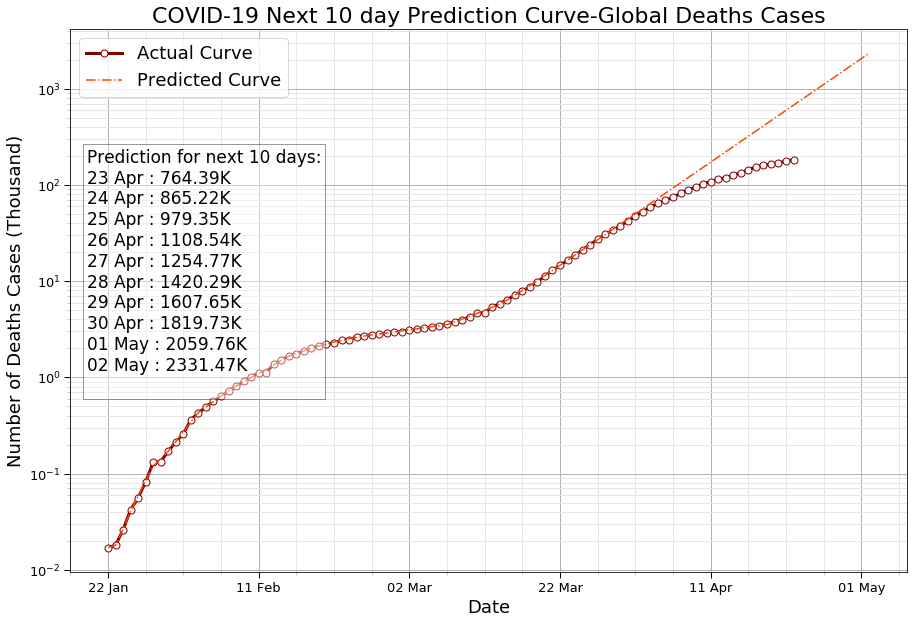

In [146]:
thousand = 1000
prediction_days = 10
data = np.power(10,model2.predict(np.arange(1,len(data_y)+prediction_days+1)))
temp_data = df_deaths.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))
# xnew = np.linspace(date.min(), date.max(), 10)
# spl = make_interp_spline(date, t, k=1)  # type: BSpline
# power_smooth = spl(xnew)

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/thousand,"-.",color="maroon",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/thousand,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-1)[0]/thousand)+"K\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=12)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve-Global Deaths Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Deaths Cases (Thousand)",fontsize =18)

plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig(out+"Prediction Curve2.png")
plt.show()

In [147]:
start_date = "4/03/20"
sd= dd(start_date,"1/22/20")
nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays
data_confirmed = np.power(10,model.predict(np.arange(1,len(data_y)+prediction_days+1)))
data_deaths = np.power(10,model2.predict(np.arange(1,len(data_y)+prediction_days+1)))
pd.DataFrame([total[sd:],
              list(np.int64(np.round(data_confirmed[sd:].reshape(-1)/million,5)*million)),
              list(df_confirmed.iloc[:,5:].sum(axis =0)[sd:]),
              list(np.int64(np.round(data_deaths[sd:].reshape(-1)/thousand,2)*thousand)),
             list(df_deaths.iloc[:,5:].sum(axis =0)[sd:])],
             ["Date","Confirmed(Predicted)","Confirmed(Actual)","Deaths(Predicted)","Deaths(Actual)"]
            ).transpose().set_index("Date")


,Confirmed(Predicted),Confirmed(Actual),Deaths(Predicted),Deaths(Actual)
Date,,,,
03 Apr,1077910,1095698,64120,58790
04 Apr,1158850,1175857,72580,64607
05 Apr,1243580,1249484,82160,69374
06 Apr,1316300,1321131,92990,74565
07 Apr,1393250,1396092,105260,81937
08 Apr,1474720,1479804,119150,88347
09 Apr,1559820,1565278,134870,95521
10 Apr,1646440,1657526,152660,102534
11 Apr,1726770,1735650,172800,108511


In [148]:
#Forecasting for USA
# Visible = Input(shape=(1,))
# Dense_l1 = Dense(80,name="Dense_l1")(Visible)
# LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)
# Dense_l2 = Dense(80,name = "Dense_l2")(LRelu_l1)
# LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)
# Dense_l3 = Dense(1,name="Dense_l3")(LRelu_l2)
# LRelu_l3 = LeakyReLU(name = "Output")(Dense_l3)
# model_usa_c = models.Model(inputs=Visible, outputs=LRelu_l3)
# model_usa_c.compile(optimizer=Adam(lr=0.0001), 
#               loss='mean_squared_error',
#               metrics=['accuracy'])
# model_usa_c.summary()

In [149]:
# model_usa_c.save('model_usa_c.h5')

In [150]:
# df_temp = df_confirmed.groupby(["country"]).sum()
# df_temp = np.asarray(df_temp[df_temp.index == "USA"].iloc[:,2:])[0]
# data_y = np.log(df_temp).astype("float32")
# data_x = np.arange(1,len(data_y)+1)
# data_x.shape[0]

In [151]:
# epochs = 3000
# model_usa_c.fit(data_x.reshape([data_x.shape[0],1]),data_y.reshape([data_x.shape[0],1]),epochs=epochs,batch_size=64)

In [152]:
model_usa_c = models.load_model("model_usa_c.h5")
model_usa_c.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 1)                 81        
_________________________________________________________________
Output (LeakyReLU)           (None, 1)                 0   

In [153]:
data = np.power(2,model_usa_c.predict(np.arange(1,len(data_y)+prediction_days+1)))

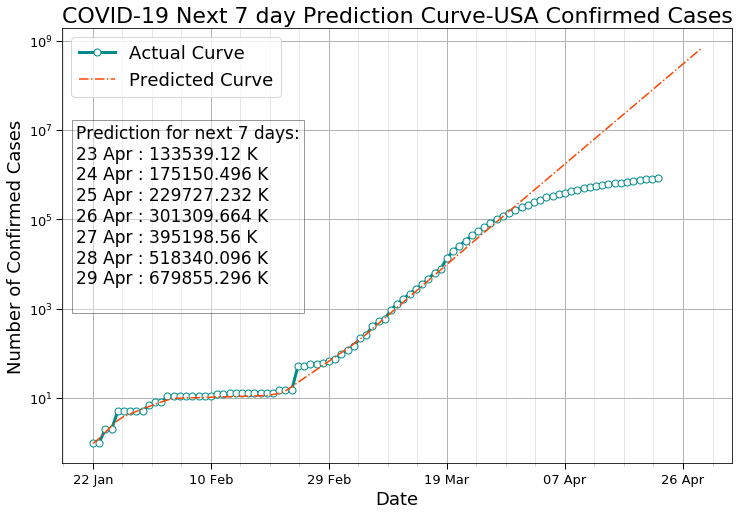

In [154]:
Thousand = 1000
prediction_days = 7
data = np.power(2,model_usa_c.predict(np.arange(1,len(data_y)+prediction_days+1)))
df_temp = df_confirmed.groupby(["country"]).sum()
temp_data = np.asarray(df_temp[df_temp.index == "USA"].iloc[:,2:])[0]
# temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(12,8))
ax = f.add_subplot(111)

date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data,"-.",color="darkcyan",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-1)[0]/Thousand)+" K\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 7 day Prediction Curve-USA Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases",fontsize =18)

plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig(out+"Prediction Curve-Confirmed (USA).png")
plt.show()


In [155]:
#################Time Series Forecasting
df_confirmed.head(2)

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,,Afghanistan,Asia,33.0000,65.0000,0,0,0,0,0,...,665,714,784,840,906,933,996,1026,1092,1176
1,,Albania,Europe,41.1533,20.1683,0,0,0,0,0,...,467,475,494,518,539,548,562,584,609,634


In [156]:
df_confirmed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 97 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   state      264 non-null    object 
 1   country    264 non-null    object 
 2   continent  264 non-null    object 
 3   Lat        264 non-null    float64
 4   Long       264 non-null    float64
 5   1/22/20    264 non-null    int64  
 6   1/23/20    264 non-null    int64  
 7   1/24/20    264 non-null    int64  
 8   1/25/20    264 non-null    int64  
 9   1/26/20    264 non-null    int64  
 10  1/27/20    264 non-null    int64  
 11  1/28/20    264 non-null    int64  
 12  1/29/20    264 non-null    int64  
 13  1/30/20    264 non-null    int64  
 14  1/31/20    264 non-null    int64  
 15  2/1/20     264 non-null    int64  
 16  2/2/20     264 non-null    int64  
 17  2/3/20     264 non-null    int64  
 18  2/4/20     264 non-null    int64  
 19  2/5/20     264 non-null    int64  
 20  2/6/20    

In [157]:
import warnings                                  # `do not disturbe` mode
warnings.filterwarnings('ignore')

import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
import matplotlib.pyplot as plt                  # plots
import seaborn as sns                            # more plots

from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions
from tqdm import tqdm_notebook



%matplotlib inline


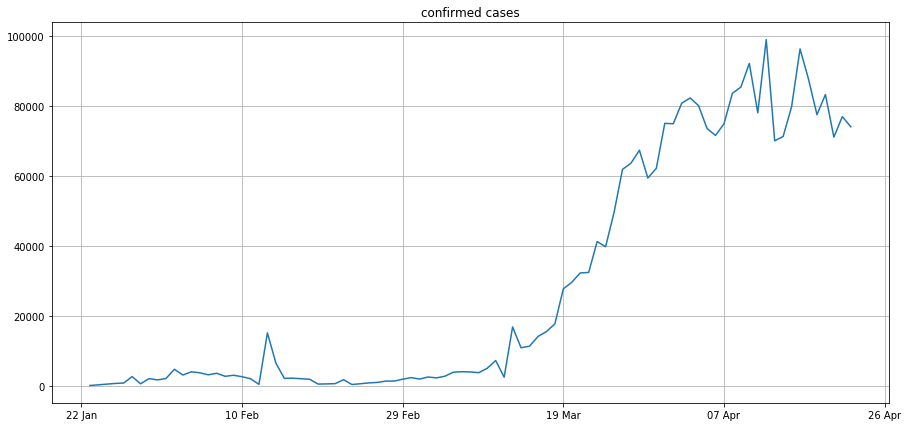

In [158]:
data = (np.nan_to_num(df_confirmed.sum()[5:].diff()))
date = np.arange(0,len(data))
plt.figure(figsize=(15, 7))
plt.plot(date,data)
nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])


plt.title('confirmed cases')
plt.grid(True)
plt.show()

In [159]:
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [160]:
df_confirmed.head(2)

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,,Afghanistan,Asia,33.0000,65.0000,0,0,0,0,0,...,665,714,784,840,906,933,996,1026,1092,1176
1,,Albania,Europe,41.1533,20.1683,0,0,0,0,0,...,467,475,494,518,539,548,562,584,609,634


In [255]:
#date_usa1 = datetime.strptime(df_confirmed.columns[-1],'%m/%d/%y').strftime("%m-%d-%Y")
#date_usa1
start_date = "01/22/20"
sd= dd(start_date,"1/22/20")
nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days-7)]
total =d+nextdays
data_confirmed = np.power(10,model.predict(np.arange(1,len(data_y)+prediction_days-7)))
data_deaths = np.power(10,model2.predict(np.arange(1,len(data_y)+prediction_days-7)))
df1=pd.DataFrame([total[sd:],
          #    list(np.int64(np.round(data_confirmed[sd:].reshape(-1)/million,5)*million)),
              list(df_confirmed.iloc[:,5:].sum(axis =0).diff()[sd:]),
           #   list(np.int64(np.round(data_deaths[sd:].reshape(-1)/thousand,2)*thousand)),
             list(df_deaths.iloc[:,5:].sum(axis =0).diff()[sd:])],
             ["Date","Confirmed","Deaths"]
            ).transpose().set_index("Date")
df1= df.iloc[1:,:]
df1['Confirmed'].astype(str).astype(float)
df1['Deaths'].astype(str).astype(float)
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 90 entries, 24 Jan to 22 Apr
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Confirmed  90 non-null     object
 1   Deaths     90 non-null     object
dtypes: object(2)
memory usage: 2.1+ KB


In [254]:
df1['Confirmed'].astype(str).astype(float)
df1['Deaths'].astype(str).astype(float)

Date
23 Jan       99.0
24 Jan      287.0
25 Jan      493.0
26 Jan      684.0
27 Jan      809.0
           ...   
18 Apr    77568.0
19 Apr    83343.0
20 Apr    71157.0
21 Apr    77035.0
22 Apr    74120.0
Name: Confirmed, Length: 91, dtype: float64

In [253]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91 entries, 23 Jan to 22 Apr
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Confirmed  91 non-null     object
 1   Deaths     91 non-null     object
dtypes: object(2)
memory usage: 4.6+ KB


In [256]:
data_y = (np.asarray(np.nan_to_num(df_confirmed.sum()[5:].diff()).astype("float32")))
data_x = np.arange(np.datetime64('2020-01-22'), len(data_y))
                    
# intialise data of lists. 
data = {'Date':data_x,'Confirmed cases': data_y} 
  
# Create DataFrame 
df = pd.DataFrame(data) 
  
# Print the output. 
df 


,Date,Confirmed cases
0,2020-01-22,NaN
1,2020-01-23,99.0
2,2020-01-24,287.0
3,2020-01-25,493.0
4,2020-01-26,684.0
...,...,...
87,2020-04-18,77568.0
88,2020-04-19,83343.0
89,2020-04-20,71157.0
90,2020-04-21,77035.0


In [232]:
def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])

moving_average(df.Deaths, 15) # prediction for the last observed day (past 24 hours)

AttributeError: 'float' object has no attribute 'dtype'

In [238]:
data_y = (np.asarray(np.nan_to_num(df_confirmed.sum()[5:].diff()).astype("float32")))
data_x = pd.date_range(start='2020-01-22',periods=92)
                    
# intialise data of lists. 
data = {'Date':data_x,'Confirmed cases': data_y} 
  
# Create DataFrame 
df = pd.DataFrame(data) 
  
# Print the output. 
df 


,Date,Confirmed cases
0,2020-01-22,NaN
1,2020-01-23,99.0
2,2020-01-24,287.0
3,2020-01-25,493.0
4,2020-01-26,684.0
...,...,...
87,2020-04-18,77568.0
88,2020-04-19,83343.0
89,2020-04-20,71157.0
90,2020-04-21,77035.0


In [239]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Date             92 non-null     datetime64[ns]
 1   Confirmed cases  91 non-null     float32       
dtypes: datetime64[ns](1), float32(1)
memory usage: 1.2 KB


In [228]:
def weighted_average(series, weights):
    """
        Calculate weighter average on series
    """
    result = 0.0
    weights.reverse()
    for n in range(len(weights)):
        result += series.iloc[-n-1] * weights[n]
    return float(result)

In [229]:
weighted_average(df, [0.6, 0.3, 0.1])

TypeError: cannot convert the series to <class 'float'>

In [268]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

In [230]:
def plotExponentialSmoothing(series, alphas):
    """
        Plots exponential smoothing with different alphas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters
        
    """
    with plt.style.context('seaborn-white'):    
        plt.figure(figsize=(15, 7))
        for alpha in alphas:
            plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
        plt.plot(series.values, "c", label = "Actual")
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Exponential Smoothing")
        plt.grid(True);

In [270]:
plotExponentialSmoothing(df.Confirmed cases, [0.3, 0.05])

SyntaxError: invalid syntax (<ipython-input-270-106eb6ee2eec>, line 1)

In [271]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result

def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """
    
    with plt.style.context('seaborn-white'):    
        plt.figure(figsize=(20, 8))
        for alpha in alphas:
            for beta in betas:
                plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
        plt.plot(series.values, label = "Actual")
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Double Exponential Smoothing")
        plt.grid(True)

In [272]:
plotDoubleExponentialSmoothing(df.Confirmed cases, alphas=[0.9, 0.02], betas=[0.9, 0.02])

SyntaxError: invalid syntax (<ipython-input-272-96254800bf72>, line 1)

In [273]:
class HoltWinters:
    
    """
    Holt-Winters model with the anomalies detection using Brutlag method
    
    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)
    
    """
    
    
    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor
        
        
    def initial_trend(self):
        sum = 0.0
        for i in range(self.slen):
            sum += float(self.series[i+self.slen] - self.series[i]) / self.slen
        return sum / self.slen  
    
    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series)/self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(sum(self.series[self.slen*j:self.slen*j+self.slen])/float(self.slen))
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += self.series[self.slen*j+i]-season_averages[j]
            seasonals[i] = sum_of_vals_over_avg/n_seasons
        return seasonals   

          
    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBond = []
        self.LowerBond = []
        
        seasonals = self.initial_seasonal_components()
        
        for i in range(len(self.series)+self.n_preds):
            if i == 0: # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i%self.slen])
                
                self.PredictedDeviation.append(0)
                
                self.UpperBond.append(self.result[0] + 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                
                self.LowerBond.append(self.result[0] - 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                continue
                
            if i >= len(self.series): # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m*trend) + seasonals[i%self.slen])
                
                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1]*1.01) 
                
            else:
                val = self.series[i]
                last_smooth, smooth = smooth, self.alpha*(val-seasonals[i%self.slen]) + (1-self.alpha)*(smooth+trend)
                trend = self.beta * (smooth-last_smooth) + (1-self.beta)*trend
                seasonals[i%self.slen] = self.gamma*(val-smooth) + (1-self.gamma)*seasonals[i%self.slen]
                self.result.append(smooth+trend+seasonals[i%self.slen])
                
                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(self.gamma * np.abs(self.series[i] - self.result[i]) 
                                               + (1-self.gamma)*self.PredictedDeviation[-1])
                     
            self.UpperBond.append(self.result[-1] + 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.LowerBond.append(self.result[-1] - 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i%self.slen])

In [240]:
prophet= pd.DataFrame(data)
prophet


,Date,Confirmed cases
0,2020-01-22,NaN
1,2020-01-23,99.0
2,2020-01-24,287.0
3,2020-01-25,493.0
4,2020-01-26,684.0
...,...,...
87,2020-04-18,77568.0
88,2020-04-19,83343.0
89,2020-04-20,71157.0
90,2020-04-21,77035.0


In [241]:
pr_data = prophet.reset_index()
pr_data.columns = ['index','ds','y']
pr_data

,index,ds,y
0,0,2020-01-22,NaN
1,1,2020-01-23,99.0
2,2,2020-01-24,287.0
3,3,2020-01-25,493.0
4,4,2020-01-26,684.0
...,...,...,...
87,87,2020-04-18,77568.0
88,88,2020-04-19,83343.0
89,89,2020-04-20,71157.0
90,90,2020-04-21,77035.0


In [164]:
m=Prophet()
m.fit(pr_data)
future=m.make_future_dataframe(periods=10)
forecast=m.predict(future)
forecast

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-22,-3351.714806,-16375.132841,6940.580875,-3351.714806,-3351.714806,-1795.721016,-1795.721016,-1795.721016,-1795.721016,-1795.721016,-1795.721016,0.0,0.0,0.0,-5147.435822
1,2020-01-23,-3099.331476,-11337.675221,12629.501511,-3099.331476,-3099.331476,3737.089310,3737.089310,3737.089310,3737.089310,3737.089310,3737.089310,0.0,0.0,0.0,637.757835
2,2020-01-24,-2846.948145,-11299.517156,12696.254757,-2846.948145,-2846.948145,3529.314781,3529.314781,3529.314781,3529.314781,3529.314781,3529.314781,0.0,0.0,0.0,682.366636
3,2020-01-25,-2594.564814,-14415.320674,10000.065708,-2594.564814,-2594.564814,158.240955,158.240955,158.240955,158.240955,158.240955,158.240955,0.0,0.0,0.0,-2436.323859
4,2020-01-26,-2342.181483,-14042.416957,10826.371932,-2342.181483,-2342.181483,169.739223,169.739223,169.739223,169.739223,169.739223,169.739223,0.0,0.0,0.0,-2172.442260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,2020-04-28,109026.356883,94774.502290,118533.744325,108597.368111,109469.427139,-2420.209587,-2420.209587,-2420.209587,-2420.209587,-2420.209587,-2420.209587,0.0,0.0,0.0,106606.147296
98,2020-04-29,110936.766876,96691.095453,120705.132272,110393.109704,111502.198961,-1795.721016,-1795.721016,-1795.721016,-1795.721016,-1795.721016,-1795.721016,0.0,0.0,0.0,109141.045860
99,2020-04-30,112847.176870,105638.291028,129620.011778,112152.185750,113576.323237,3737.089310,3737.089310,3737.089310,3737.089310,3737.089310,3737.089310,0.0,0.0,0.0,116584.266180
100,2020-05-01,114757.586863,105907.646364,130414.001746,113918.286021,115660.885375,3529.314781,3529.314781,3529.314781,3529.314781,3529.314781,3529.314781,0.0,0.0,0.0,118286.901644


In [242]:
cnfrm = forecast.loc[:,['ds','trend']]
cnfrm = cnfrm[cnfrm['trend']>0]
cnfrm=cnfrm.tail(15)
cnfrm.columns = ['Date','Confirm']
cnfrm.head()

AttributeError: 'tuple' object has no attribute 'loc'

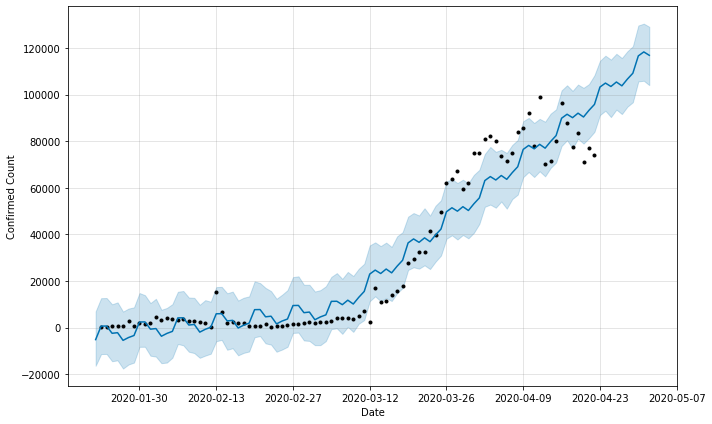

In [166]:
fig = plot_plotly(m, forecast)
py.iplot(fig) 

fig = m.plot(forecast,xlabel='Date',ylabel='Confirmed Count')

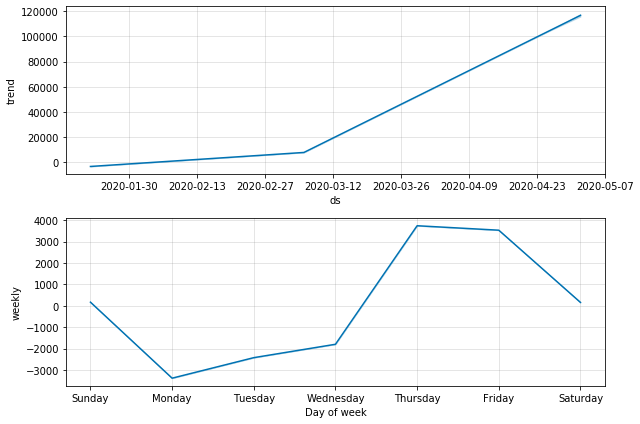

In [167]:
figure=m.plot_components(forecast)

In [169]:
#ARIMA
data_y = (np.asarray(np.nan_to_num(df_confirmed.sum()[5:].astype("float32"))))
data_x = pd.date_range(start='2020-01-22',periods=92)
                    
# intialise data of lists. 
data = {'Date':data_x,'Confirmed cases': data_y} 
  
# Create DataFrame 
arima_data = pd.DataFrame(data) 
  
# Print the output. 
arima_data 


,Date,Confirmed cases
0,2020-01-22,555.0
1,2020-01-23,654.0
2,2020-01-24,941.0
3,2020-01-25,1434.0
4,2020-01-26,2118.0
...,...,...
87,2020-04-18,2317758.0
88,2020-04-19,2401101.0
89,2020-04-20,2472258.0
90,2020-04-21,2549293.0


In [170]:
model = ARIMA(arima_data['Confirmed cases'].values, order=(1, 2, 1))
fit_model = model.fit(trend='c', full_output=True, disp=True)
fit_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                   D2.y   No. Observations:                   90
Model:                 ARIMA(1, 2, 1)   Log Likelihood                -911.150
Method:                       css-mle   S.D. of innovations           6028.354
Date:                Thu, 23 Apr 2020   AIC                           1830.301
Time:                        00:20:50   BIC                           1840.300
Sample:                             2   HQIC                          1834.333
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        836.9750    437.173      1.915      0.056     -19.869    1693.819
ar.L1.D2.y    -0.1436      0.406     -0.354      0.723      -0.939       0.651
ma.L1.D2.y    -0.2169      0.414     -0.524      0.600      -1.028       0.594
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -6.9617           +0.0000j            6.9617            0.5000
MA.1            4.6112           +0.0000j            4.6112            0.0000
-----------------------------------------------------------------------------
"""

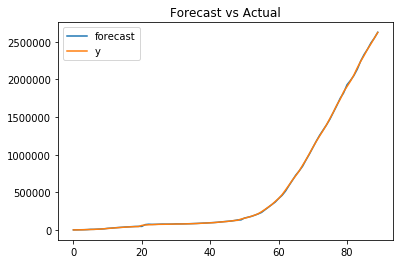

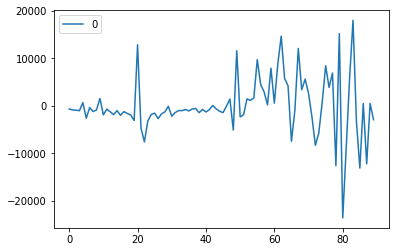

In [171]:
fit_model.plot_predict()
plt.title('Forecast vs Actual')
pd.DataFrame(fit_model.resid).plot()

In [172]:
forecast = fit_model.forecast(steps=10)
pred_y = forecast[0].tolist()
pd.DataFrame(pred_y)

,0
0,2.699541e+06
1,2.776338e+06
2,2.853995e+06
3,2.932487e+06
4,3.011816e+06
5,3.091981e+06
6,3.172984e+06
7,3.254824e+06
8,3.337500e+06
9,3.421014e+06


In [173]:
dataset = df
dataset.head()

,Date,Confirmed cases
0,2020-01-22,NaN
1,2020-01-23,99.0
2,2020-01-24,287.0
3,2020-01-25,493.0
4,2020-01-26,684.0


In [174]:
#LSTM

data = np.array(dataset).reshape(-1, 1)
train_data = dataset[:len(dataset)-5]
test_data = dataset[len(dataset)-5:]

In [175]:
scaler = MinMaxScaler()
scaler.fit(train_data)
scaled_train_data = scaler.transform(train_data)
scaled_test_data = scaler.transform(test_data)
n_input =5
n_features =1
                             
generator = TimeseriesGenerator(scaled_train_data,scaled_train_data, length=n_input, batch_size=1)

lstm_model = Sequential()
lstm_model.add(LSTM(units = 50, return_sequences = True, input_shape = (n_input, n_features)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(units = 50, return_sequences = True))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(units = 50))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(units = 1))
lstm_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
lstm_model.fit(generator, epochs = 30)


TypeError: invalid type promotion

In [249]:
###SIR model
# ML libraries
import lightgbm as lgb
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

In [245]:
!pip install lightgbm

In [248]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [257]:
data_y = (np.asarray(np.nan_to_num(df_confirmed.sum()[5:].diff()).astype("float32")))
data_x = np.arange(np.datetime64('2020-01-22'), len(data_y))
                    
# intialise data of lists. 
data = {'Date':data_x,'Confirmed cases': data_y} 
  
# Create DataFrame 
df = pd.DataFrame(data) 
  
# Print the output. 
df 

,Date,Confirmed cases
0,2020-01-22,NaN
1,2020-01-23,99.0
2,2020-01-24,287.0
3,2020-01-25,493.0
4,2020-01-26,684.0
...,...,...
87,2020-04-18,77568.0
88,2020-04-19,83343.0
89,2020-04-20,71157.0
90,2020-04-21,77035.0


In [ ]:
data_y1 = (np.asarray(np.nan_to_num(df_death.sum()[5:].diff()).astype("float32")))
data_x1 = np.arange(np.datetime64('2020-01-22'), len(data_y))
                    
# intialise data of lists. 
data = {'Date':data_x1,'Deaths': data_y1} 
  
# Create DataFrame 
df2 = pd.DataFrame(data) 
  
# Print the output. 
df2 

In [258]:
df.to_csv("confirmed.csv",index=False)

In [262]:
##xgboost
xg = pd.read_csv('confirmed.csv', index_col=[0], parse_dates=[0])
xg

,Confirmed cases
Date,
2020-01-22,NaN
2020-01-23,99.0
2020-01-24,287.0
2020-01-25,493.0
2020-01-26,684.0
...,...
2020-04-18,77568.0
2020-04-19,83343.0
2020-04-20,71157.0


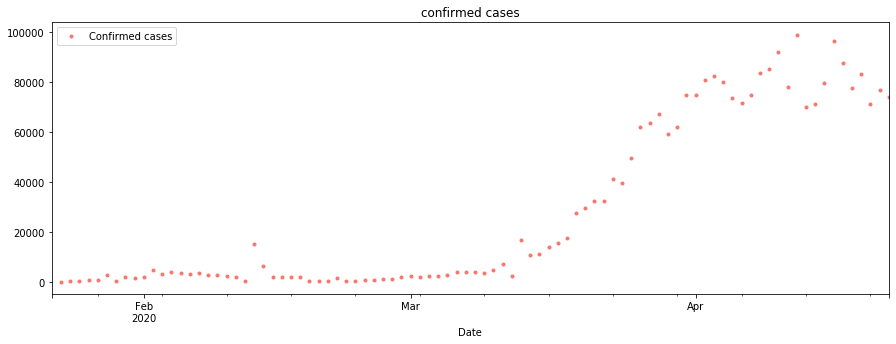

In [261]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = xg.plot(style='.', figsize=(15,5), color=color_pal[0], title='confirmed cases')

In [263]:
#####LSTM
import torch

import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import register_matplotlib_converters
from torch import nn, optim

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 14, 10
register_matplotlib_converters()

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)


ModuleNotFoundError: No module named 'torch'